## 📊 Python Script to Process Indian Energy Data (Excel)

This script reads an Excel file containing energy data, combines the year and time columns into a proper datetime format, extracts relevant columns, and saves the cleaned dataset into a new Excel file.


In [2]:
import pandas as pd

file_path = './data_india_ENRG.xlsx' 
data = pd.read_excel(file_path, sheet_name='Sheet1')

data['Combined Date'] = data['Year'].astype(str) + " " + data['Date']
data['Formatted Date'] = pd.to_datetime(data['Combined Date'], format='%Y %d-%b %I%p')

data['Datetime'] = data['Formatted Date'].dt.strftime('%d-%m-%Y %H:%M')

filtered_data = data[['Datetime', 'NA_MW']]

output_file_path = 'data_india_ENRG-3.xlsx' 
filtered_data.to_excel(output_file_path, index=False)

print(f"Filtered file saved as: {output_file_path}")


Filtered file saved as: data_india_ENRG-3.xlsx


## 📦 Library Imports and Setup

We begin by importing essential Python libraries for data analysis and visualization:


In [3]:
import xgboost
print(xgboost.__version__)

3.0.4


In [4]:
pip install xgboost --upgrade

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import optuna
color_pal = sns.color_palette()

## ⏱️ Datetime Index Preparation for Energy Data

We started by loading the Excel file containing India's energy data. The `Datetime` column, which initially existed as a plain string, was converted into a proper datetime format. This allows for efficient time-series operations and plotting.

After loading, we:

- Set the `Datetime` column as the DataFrame index to treat it as a time-series.
- Used `pd.to_datetime()` with a specific format (`%d-%m-%Y %H:%M`) to accurately parse the string values into pandas datetime objects.
- Verified that the time range spans from January 1, 2017, to April 30, 2024.
- Confirmed that the dataset contains **64,248 hourly entries**, with one column: `NA_MW` (likely representing energy load in megawatts).

Now the data is ready for resampling, time-based filtering, or visualization.


In [7]:
file_path = './data_india_ENRG-3.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

In [8]:
df.tail()

,Datetime,NA_MW
64243,30-04-2024 19:00,201094.24
64244,30-04-2024 20:00,196577.71
64245,30-04-2024 21:00,194782.12
64246,30-04-2024 22:00,194967.39
64247,30-04-2024 23:00,194194.45


In [9]:
df = df.set_index('Datetime')

In [10]:
df.index = pd.to_datetime(df.index, format='%d-%m-%Y %H:%M')

In [11]:
df.head()

,NA_MW
Datetime,
2017-01-01 00:00:00,108985.17
2017-01-01 01:00:00,105856.08
2017-01-01 02:00:00,103115.75
2017-01-01 03:00:00,102407.04
2017-01-01 04:00:00,104235.34


## 📈 Hourly Energy Consumption Trends in India (2017–2024)

The line plot below illustrates the hourly energy consumption in India over a span of seven years, from 2017 to 2024. The data is visualized with a consistent and subtle color scheme to highlight fluctuations and seasonal trends over time.

Key details:
- **X-axis**: Time (Datetime index, hourly intervals)
- **Y-axis**: Energy consumption measured in **megawatts (MW)**
- **Color**: Light orange (`#F4A582`) to provide clear visibility without overwhelming the visual
- **Grid**: Added for better readability of data patterns

This visualization helps identify long-term growth, periodic dips (possibly due to seasonal effects), and overall energy demand patterns across years. It is useful for policy analysts, researchers, and energy planners to assess demand-side dynamics.


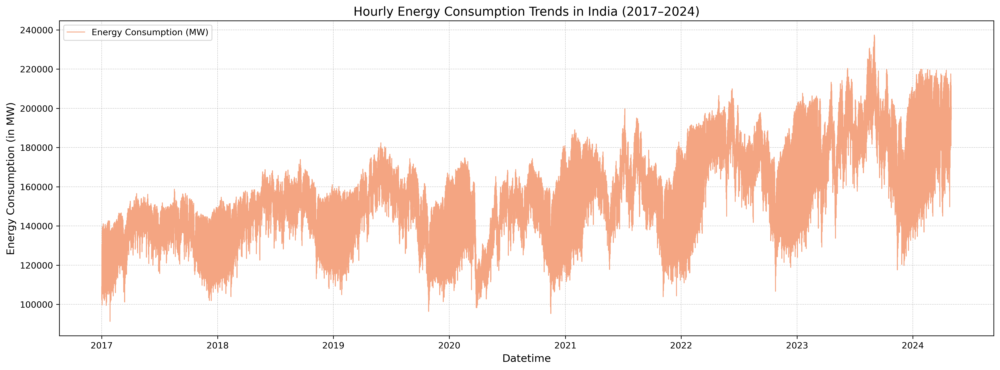

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 6), dpi=300)
plt.plot(df.index, df['NA_MW'], color='#F4A582', linewidth=1, label='Energy Consumption (MW)')
plt.title('Hourly Energy Consumption Trends in India (2017–2024)', fontsize=14)
plt.xlabel('Datetime', fontsize=12)
plt.ylabel('Energy Consumption (in MW)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


<Axes: ylabel='Frequency'>

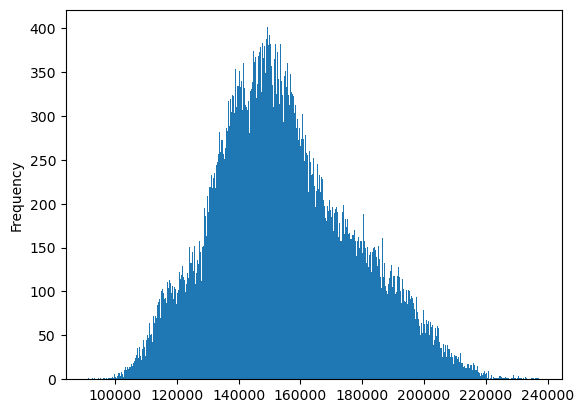

In [13]:
df['NA_MW'].plot(kind='hist', bins=500)

Cleaned dataset size: 63994
NA_MW range after cleaning: 93128.41 to 215449.83


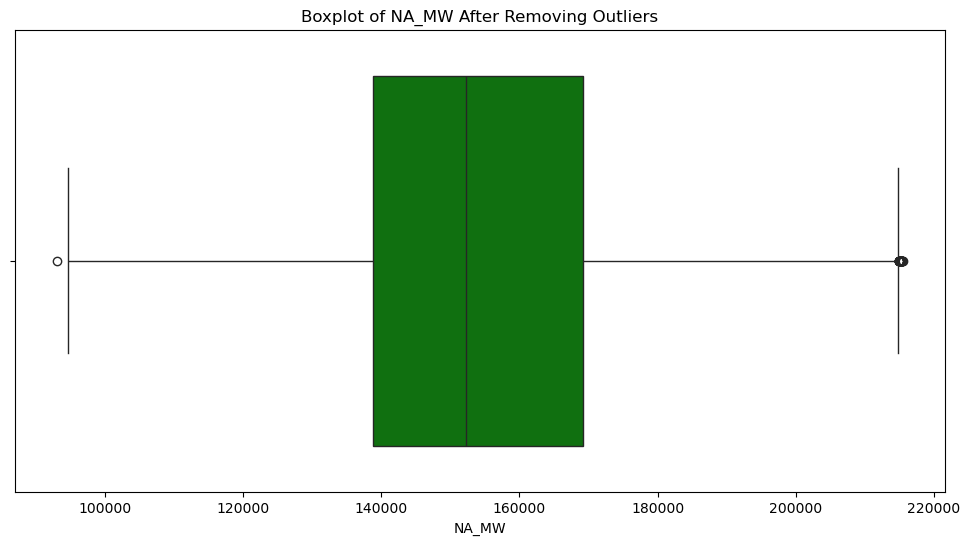

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Q1 = df['NA_MW'].quantile(0.25)
Q3 = df['NA_MW'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df['NA_MW'] >= lower_bound) & (df['NA_MW'] <= upper_bound)]

print(f"Cleaned dataset size: {len(df)}")
print(f"NA_MW range after cleaning: {df['NA_MW'].min()} to {df['NA_MW'].max()}")

plt.figure(figsize=(12, 6))
sns.boxplot(x=df['NA_MW'], color='green')
plt.title('Boxplot of NA_MW After Removing Outliers')
plt.show()

In [15]:
df.head()

,NA_MW
Datetime,
2017-01-01 00:00:00,108985.17
2017-01-01 01:00:00,105856.08
2017-01-01 02:00:00,103115.75
2017-01-01 03:00:00,102407.04
2017-01-01 04:00:00,104235.34


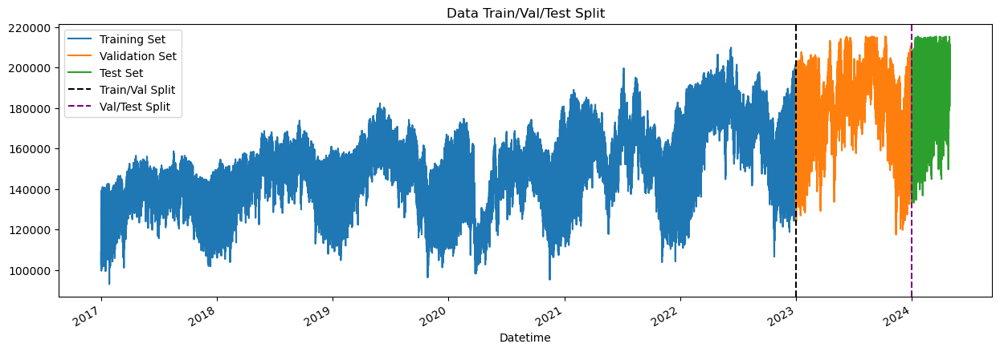

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Train: until 2022-12-31 23:00
# Val:   2023-01-01 ... 2023-12-31 23:00
# Test:  2024-01-01 onward
cutoff_train = pd.to_datetime('2023-01-01')
cutoff_val   = pd.to_datetime('2024-01-01')

train = df.loc[df.index < cutoff_train]
val   = df.loc[(df.index >= cutoff_train) & (df.index < cutoff_val)]
test  = df.loc[df.index >= cutoff_val]

fig, ax = plt.subplots(figsize=(15, 5))
train['NA_MW'].plot(ax=ax, label='Training Set', color='tab:blue')
val['NA_MW'].plot(ax=ax, label='Validation Set', color='tab:orange')
test['NA_MW'].plot(ax=ax, label='Test Set', color='tab:green')

ax.axvline(cutoff_train, color='black', linestyle='--', label='Train/Val Split')
ax.axvline(cutoff_val,   color='purple', linestyle='--', label='Val/Test Split')

ax.set_title('Data Train/Val/Test Split')
ax.legend()
plt.show()

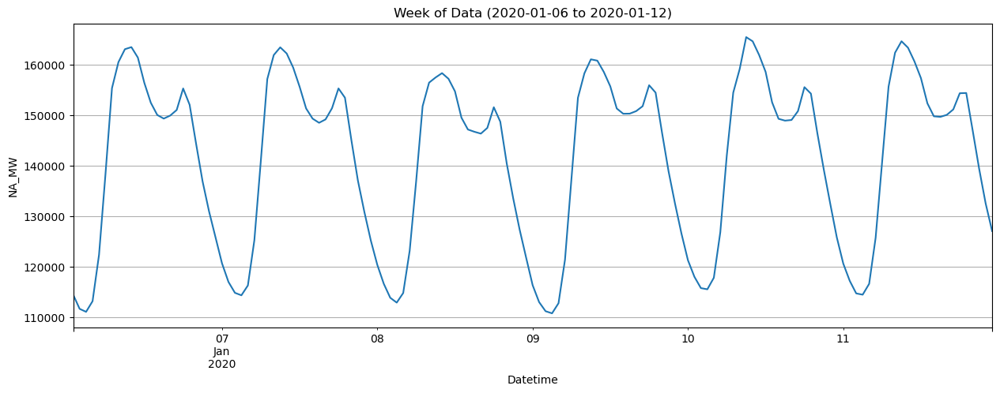

In [17]:
df.loc[(df.index > '2020-01-06') & (df.index < '2020-01-12'), 'NA_MW'] \
  .plot(figsize=(15, 5), title='Week of Data (2020-01-06 to 2020-01-12)')

plt.xlabel('Datetime')
plt.ylabel('NA_MW')
plt.grid(True)
plt.show()

In [18]:
def create_features(df):
    """
    Create time series features based on time series index.
    """
    df = df.copy()
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week
    return df

df = create_features(df)

In [19]:
df.sample(5)

,NA_MW,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
Datetime,,,,,,,,,
2020-07-26 14:00:00,150779.88,14,6,3,7,2020,208,26,30
2018-10-10 12:00:00,161592.58,12,2,4,10,2018,283,10,41
2018-11-03 06:00:00,146533.17,6,5,4,11,2018,307,3,44
2020-08-22 22:00:00,146071.49,22,5,3,8,2020,235,22,34
2023-07-21 02:00:00,186578.37,2,4,3,7,2023,202,21,29


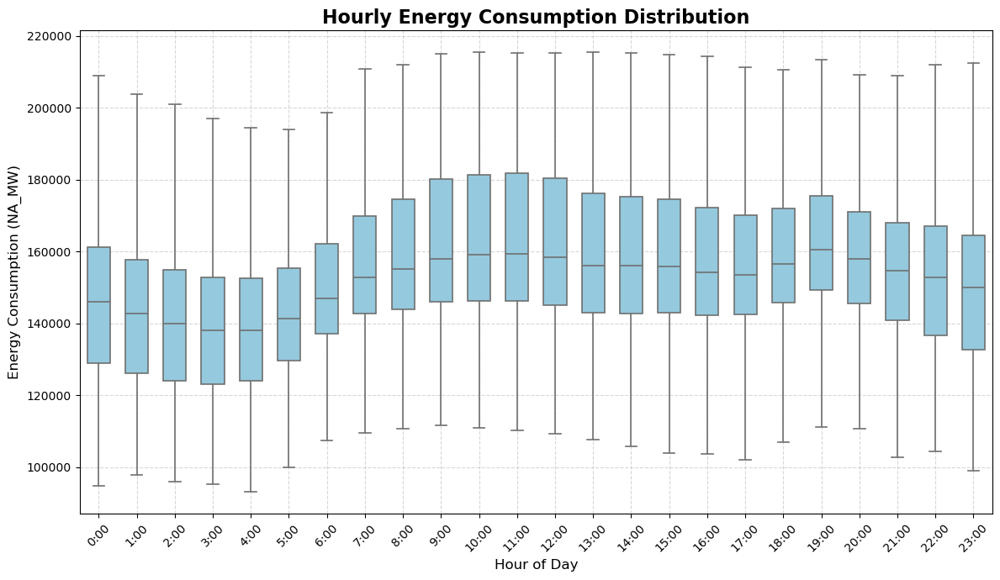

In [20]:
fig, ax = plt.subplots(figsize=(12, 7))

sns.boxplot(
    data=df,
    x='hour',
    y='NA_MW',
    color='skyblue',
    showfliers=False,
    linewidth=1.2,
    width=0.6,
    ax=ax
)

ax.set_title('Hourly Energy Consumption Distribution', fontsize=16, fontweight='bold')
ax.set_xlabel('Hour of Day', fontsize=12)
ax.set_ylabel('Energy Consumption (NA_MW)', fontsize=12)

ax.grid(True, linestyle='--', alpha=0.5)
ax.set_xticks(range(0, 24))
ax.set_xticklabels([f'{h}:00' for h in range(0, 24)], rotation=45)

plt.tight_layout()
plt.show()

/var/folders/fx/2j6wthvx3ss0j55xgc1txl0m0000gn/T/ipykernel_10003/3811740319.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='month', y='NA_MW', palette='Blues')


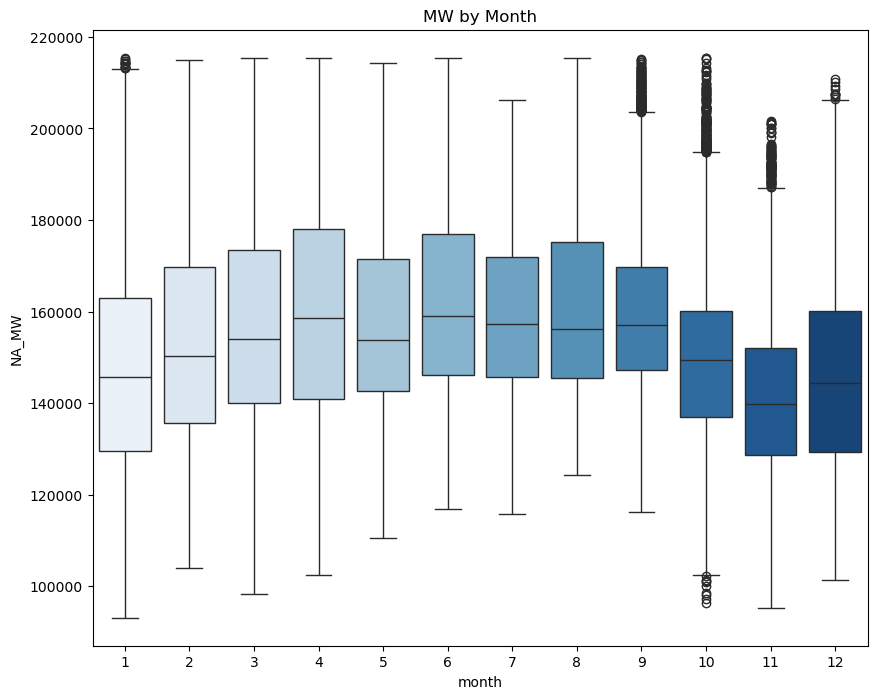

In [21]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(data=df, x='month', y='NA_MW', palette='Blues')
ax.set_title('MW by Month')
plt.show()

In [22]:
df = df.copy()
df['hour']       = df.index.hour
df['dayofweek']  = df.index.dayofweek
df['quarter']    = df.index.quarter
df['month']      = df.index.month
df['year']       = df.index.year
df['dayofyear']  = df.index.dayofyear
df['dayofmonth'] = df.index.day
df['weekofyear'] = df.index.isocalendar().week.astype(int)
df['is_weekend'] = (df.index.dayofweek >= 5).astype(int)


def add_fourier_terms(df, daily_k=2, weekly_k=2, yearly_k=2):
    df = df.copy()
    t = (df.index - df.index[0]) / pd.Timedelta(hours=1)
    t = t.astype(float).values
    for k in range(1, daily_k + 1):
        df[f'sin_d_{k}'] = np.sin(2*np.pi*k*df.index.hour/24)
        df[f'cos_d_{k}'] = np.cos(2*np.pi*k*df.index.hour/24)

    period_w = 168.0
    for k in range(1, weekly_k + 1):
        df[f'sin_w_{k}'] = np.sin(2*np.pi*k*t/period_w)
        df[f'cos_w_{k}'] = np.cos(2*np.pi*k*t/period_w)

    period_y = 365.25 * 24.0
    for k in range(1, yearly_k + 1):
        df[f'sin_y_{k}'] = np.sin(2*np.pi*k*t/period_y)
        df[f'cos_y_{k}'] = np.cos(2*np.pi*k*t/period_y)

    return df

def add_anomaly_flags(df, window=168, z_thresh=3.0):
    df = df.copy()
    s1 = df['NA_MW'].shift(1)

    roll_mean = s1.rolling(window, min_periods=window).mean()
    roll_std  = s1.rolling(window, min_periods=window).std()

    z = (df['NA_MW'] - roll_mean) / roll_std
    df['zscore_{}'.format(window)] = z
    df['anomaly_flag_{}'.format(window)] = (z.abs() > z_thresh).astype(int)

    return df

df = add_fourier_terms(df, daily_k=2, weekly_k=2, yearly_k=2)
df = add_anomaly_flags(df, window=168, z_thresh=3.0)

col = 'zscore_168'
df[col] = (df[col]
           .replace([np.inf, -np.inf], np.nan)
           .fillna(0)
           .clip(-6, 6))

cutoff_train = pd.to_datetime('2023-01-01')
cutoff_val   = pd.to_datetime('2024-01-01')
train = df.loc[df.index < cutoff_train]
val   = df.loc[(df.index >= cutoff_train) & (df.index < cutoff_val)]
test  = df.loc[df.index >= cutoff_val]

def create_lag_features(df_in):
    df2 = df_in.copy()
    s = df2['NA_MW']
    df2.loc[:, 'lag_24']  = s.shift(24)
    df2.loc[:, 'lag_168'] = s.shift(168)
    s1 = s.shift(1)
    df2.loc[:, 'rolling_mean_168'] = s1.rolling(168, min_periods=168).mean()
    df2.loc[:, 'rolling_std_168']  = s1.rolling(168, min_periods=168).std()
    return df2.dropna()

def make_features_for_split(history_df, split_df, max_window=168):
    hist_tail = history_df.sort_index().tail(max_window)
    tmp = pd.concat([hist_tail, split_df]).sort_index()
    tmp = create_lag_features(tmp)
    return tmp.loc[split_df.index]

train_f = create_lag_features(train)
val_f   = make_features_for_split(train, val)
test_f  = make_features_for_split(pd.concat([train, val]), test)

FEATURES = [
    # time / calendar already in your df:
    'hour','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear','is_weekend',
    # Fourier (adjust counts if you changed k):
    'sin_d_1','cos_d_1','sin_d_2','cos_d_2',
    'sin_w_1','cos_w_1','sin_w_2','cos_w_2',
    'sin_y_1','cos_y_1','sin_y_2','cos_y_2',
    # anomaly
    'zscore_168','anomaly_flag_168',
    # lags/rollings
    'lag_24','lag_168','rolling_mean_168','rolling_std_168'
]
TARGET = 'NA_MW'

X_train, y_train = train_f[FEATURES], train_f[TARGET]
X_val,   y_val   = val_f[FEATURES],   val_f[TARGET]
X_test,  y_test  = test_f[FEATURES],  test_f[TARGET]

In [23]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(52413, 27) (52413,)
(8571, 27) (8571,)
(2842, 27) (2842,)


In [22]:
def objective(trial):
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 50.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 50.0),
        'random_state': 42,
        'objective': 'reg:squarederror',
        'early_stopping_rounds': 20
    }
    model = XGBRegressor(**params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200, n_jobs=-1)

best_params = study.best_params
print("\nBest Parameters:", best_params)

[I 2025-08-13 20:09:33,095] A new study created in memory with name: no-name-4f29d698-06e4-403e-b3ca-d5bb5a67773a
[I 2025-08-13 20:09:35,163] Trial 7 finished with value: 6269.248695461429 and parameters: {'learning_rate': 0.2662100684800457, 'n_estimators': 511, 'max_depth': 7, 'min_child_weight': 3, 'colsample_bytree': 0.5994023049499548, 'subsample': 0.5216610049740009, 'gamma': 0.6580148373898559, 'reg_alpha': 38.9628068236007, 'reg_lambda': 17.890378812855147}. Best is trial 7 with value: 6269.248695461429.
[I 2025-08-13 20:09:35,187] Trial 3 finished with value: 5838.725755977755 and parameters: {'learning_rate': 0.25936405709101296, 'n_estimators': 331, 'max_depth': 7, 'min_child_weight': 5, 'colsample_bytree': 0.7543201741430554, 'subsample': 0.7648316061686397, 'gamma': 1.5317469618637458, 'reg_alpha': 15.720964882943905, 'reg_lambda': 44.65751952963043}. Best is trial 3 with value: 5838.725755977755.
[I 2025-08-13 20:09:35,713] Trial 1 finished with value: 5822.647730793442 a


Best Parameters: {'learning_rate': 0.25263893351226296, 'n_estimators': 527, 'max_depth': 3, 'min_child_weight': 7, 'colsample_bytree': 0.9579361051859853, 'subsample': 0.8238383992715469, 'gamma': 4.101087638765242, 'reg_alpha': 28.91564405567139, 'reg_lambda': 6.960181867047455}


In [23]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_absolute_percentage_error

X_final = pd.concat([X_train, X_val])
y_final = pd.concat([y_train, y_val])

final_model = XGBRegressor(**best_params)
final_model.fit(X_final, y_final)

y_pred = final_model.predict(X_test)

final_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
final_mae = mean_absolute_error(y_test, y_pred)
final_mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # in %
final_r2 = r2_score(y_test, y_pred)

print(f"\nFinal Test RMSE: {final_rmse:.2f} MW")
print(f"Final Test MAE: {final_mae:.2f} MW")
print(f"Final Test MAPE: {final_mape:.2f} %")
print(f"Final Test R²: {final_r2:.4f}")


Final Test RMSE: 3864.18 MW
Final Test MAE: 2886.86 MW
Final Test MAPE: 1.57 %
Final Test R²: 0.9602


In [24]:
# Naive baseline: predict current as previous hour
y_pred_naive = y_test.shift(1)  # shift by 1 hour
y_pred_naive = y_pred_naive.fillna(method='bfill')

naive_rmse = np.sqrt(mean_squared_error(y_test, y_pred_naive))
naive_mae = mean_absolute_error(y_test, y_pred_naive)
naive_mape = mean_absolute_percentage_error(y_test, y_pred_naive) * 100
naive_r2 = r2_score(y_test, y_pred_naive)

print(f"Naive RMSE: {naive_rmse:.2f} MW")
print(f"Naive MAE: {naive_mae:.2f} MW")
print(f"Naive MAPE: {naive_mape:.2f} %")
print(f"Naive R²: {naive_r2:.4f}")

Naive RMSE: 6237.21 MW
Naive MAE: 4892.38 MW
Naive MAPE: 2.69 %
Naive R²: 0.8964


/var/folders/fx/2j6wthvx3ss0j55xgc1txl0m0000gn/T/ipykernel_4152/1050656019.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y_pred_naive = y_pred_naive.fillna(method='bfill')


### Model Performance Comparison: Naïve Persistence vs Tuned XGBoost

| Metric        | Naïve Persistence (ŷₜ = yₜ₋₁) | XGBoost (Tuned) | Improvement |
|---------------|---------------------------------|-----------------|-------------|
| **RMSE (MW)** | 6,237.21                        | **3,864.18**    | **−38.05%** |
| **MAE (MW)**  | 4,892.38                        | **2,886.86**    | **−40.99%** |
| **MAPE (%)**  | 2.69                            | **1.57**        | **−41.64%** |
| **R²**        | 0.8964                          | **0.9602**      | **+6.38 p.p.** |

**Interpretation**
- XGBoost reduces average percentage error from **2.69%** to **1.57%**, a **41.64%** relative reduction.
- RMSE and MAE decrease by roughly **38–41%**, showing much tighter predictions than the persistence baseline.
- R² improves by **+0.0638** (absolute), reflecting stronger explanatory power over hourly demand variability.

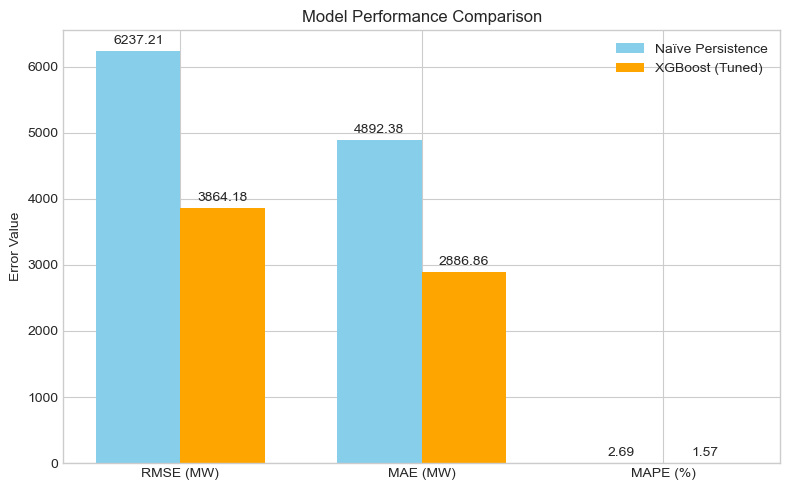

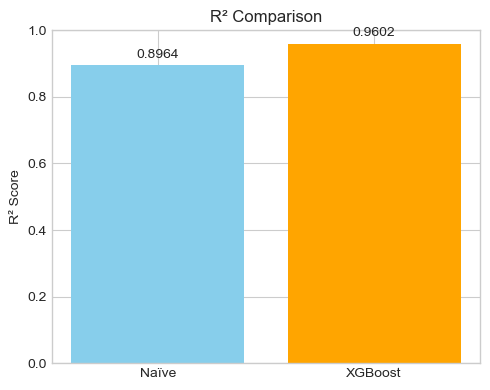

In [40]:
import matplotlib.pyplot as plt
import numpy as np

# Updated metrics from your runs
metrics = ['RMSE (MW)', 'MAE (MW)', 'MAPE (%)']
naive_values = [6237.21, 4892.38, 2.69]
xgb_values   = [3864.18, 2886.86, 1.57]   # <- updated

x = np.arange(len(metrics))
width = 0.35

# Error metrics bar chart
fig, ax1 = plt.subplots(figsize=(8, 5))
bars1 = ax1.bar(x - width/2, naive_values, width, label='Naïve Persistence', color='skyblue')
bars2 = ax1.bar(x + width/2, xgb_values,   width, label='XGBoost (Tuned)',  color='orange')

ax1.set_ylabel('Error Value')
ax1.set_title('Model Performance Comparison')
ax1.set_xticks(x)
ax1.set_xticklabels(metrics)
ax1.legend()

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

# R² comparison (updated values)
fig, ax2 = plt.subplots(figsize=(5, 4))
r2_vals = [0.8964, 0.9602]  # Naïve, XGBoost
ax2.bar(['Naïve', 'XGBoost'], r2_vals, color=['skyblue', 'orange'])
ax2.set_ylim(0, 1)
ax2.set_ylabel('R² Score')
ax2.set_title('R² Comparison')

for i, val in enumerate(r2_vals):
    ax2.annotate(f'{val:.4f}', xy=(i, val), xytext=(0, 3),
                 textcoords="offset points", ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [26]:
import joblib

joblib.dump(final_model, 'best_xgBoost.pkl')

['best_xgBoost.pkl']

In [27]:
assert X_train.index.max() < X_val.index.min()
assert X_val.index.max() < X_test.index.min()

In [28]:
test = test_f.copy()  # ensure correct DataFrame

test['prediction'] = final_model.predict(X_test)
test['error'] = np.abs(test[TARGET] - test['prediction'])

daily_mean_error = (
    test.groupby(test.index.date)['error']
    .mean()
    .sort_values(ascending=False)
)

top_10_bad_days = daily_mean_error.head(10)

print("Top 10 Dates with Highest Mean Absolute Error:")
print(top_10_bad_days)

Top 10 Dates with Highest Mean Absolute Error:
2024-01-23    6820.666771
2024-01-26    6790.412266
2024-01-20    6570.966536
2024-02-17    5885.395625
2024-01-30    5796.384943
2024-01-31    5590.004261
2024-02-15    5207.617370
2024-02-01    5153.674557
2024-01-28    5119.217031
2024-02-10    5014.570911
Name: error, dtype: float64


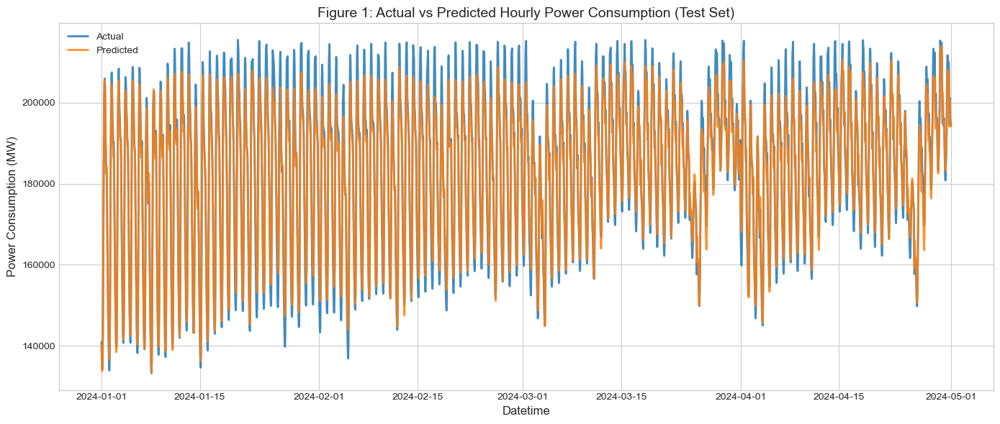

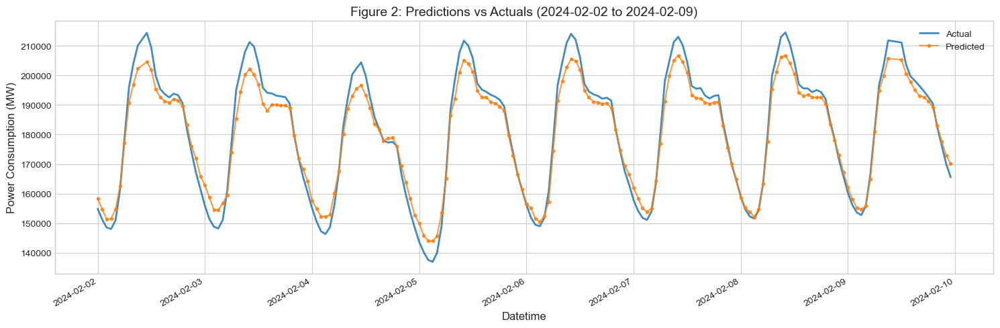

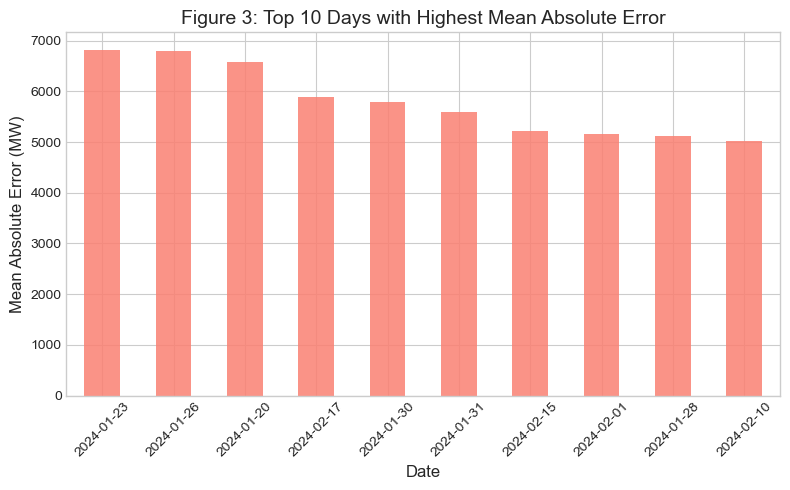

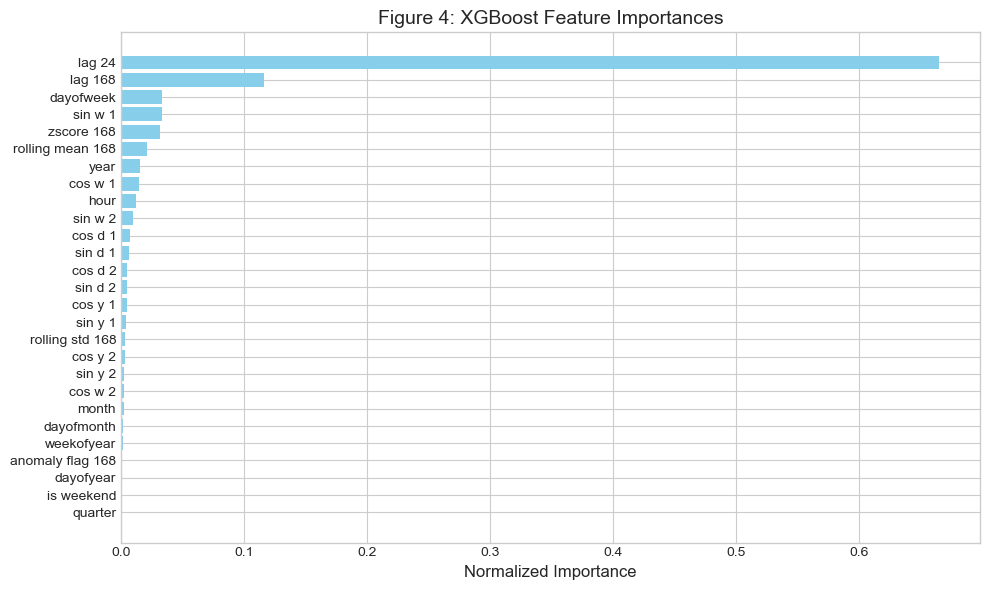

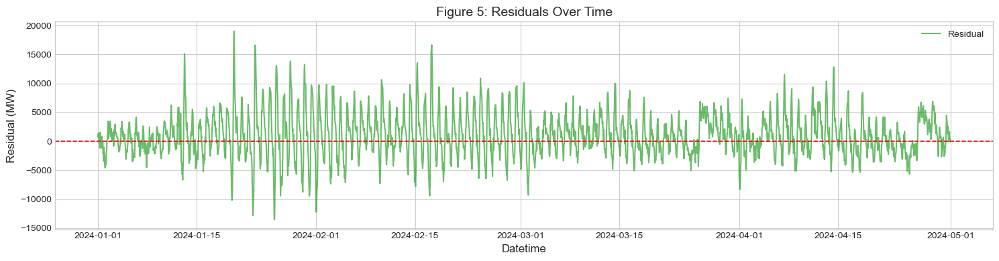

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.style.use('seaborn-v0_8-whitegrid')
COLORS = {
    "actual": "#1f77b4",      # blue
    "prediction": "#ff7f0e",  # orange
    "residual": "#2ca02c"     # green
}

plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label="Actual", color=COLORS["actual"], linewidth=2, alpha=0.85)
plt.plot(y_test.index, y_pred, label="Predicted", color=COLORS["prediction"], linewidth=2, alpha=0.85)
plt.title("Figure 1: Actual vs Predicted Hourly Power Consumption (Test Set)", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig1_actual_vs_predicted_full.png", dpi=300)
plt.show()

y_pred_series = pd.Series(y_pred, index=X_test.index, name='prediction')
df.loc[y_pred_series.index, 'prediction'] = y_pred_series

start_date = '2024-02-02'
end_date = '2024-02-09'

plt.figure(figsize=(15, 5))
ax = df.loc[start_date:end_date, 'NA_MW'].plot(label='Actual', color=COLORS["actual"], linewidth=2, alpha=0.85)
df.loc[start_date:end_date, 'prediction'].plot(ax=ax, style='.-', label='Predicted', color=COLORS["prediction"], alpha=0.8)
plt.title(f"Figure 2: Predictions vs Actuals ({start_date} to {end_date})", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig2_actual_vs_predicted_week.png", dpi=300)
plt.show()

test_copy = test_f.copy()
test_copy['prediction'] = final_model.predict(X_test)
test_copy['error'] = np.abs(test_copy[TARGET] - test_copy['prediction'])

daily_mean_error = (
    test_copy.groupby(test_copy.index.date)['error']
    .mean()
    .sort_values(ascending=False)
)
top_10_bad_days = daily_mean_error.head(10)

plt.figure(figsize=(8, 5))
top_10_bad_days.plot(kind='bar', color='salmon', alpha=0.85)
plt.title("Figure 3: Top 10 Days with Highest Mean Absolute Error", fontsize=14)
plt.ylabel("Mean Absolute Error (MW)", fontsize=12)
plt.xlabel("Date", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("fig3_top10_bad_days.png", dpi=300)
plt.show()

importances = final_model.feature_importances_
feat_importance_df = pd.DataFrame({
    'Feature': X_final.columns,
    'Importance': importances
})
feat_importance_df['Importance'] = feat_importance_df['Importance'] / feat_importance_df['Importance'].sum()
feat_importance_df = feat_importance_df.sort_values(by='Importance', ascending=False)
feat_importance_df['Feature'] = feat_importance_df['Feature'].str.replace('_', ' ')

plt.figure(figsize=(10, 6))
plt.barh(feat_importance_df['Feature'], feat_importance_df['Importance'], color='skyblue')
plt.xlabel("Normalized Importance", fontsize=12)
plt.title("Figure 4: XGBoost Feature Importances", fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("fig4_feature_importances.png", dpi=300)
plt.show()

test_copy['residual'] = test_copy[TARGET] - test_copy['prediction']

plt.figure(figsize=(15, 4))
plt.plot(test_copy.index, test_copy['residual'], label='Residual', color=COLORS["residual"], alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)
plt.title("Figure 5: Residuals Over Time", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Residual (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig5_residuals_over_time.png", dpi=300)
plt.show()

## LightGBM

[I 2025-08-13 20:11:46,738] A new study created in memory with name: no-name-bdbfa2a7-ec2b-4e4d-ab74-387054c46b8e


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


[I 2025-08-13 20:11:49,711] Trial 4 finished with value: 4621.507131481796 and parameters: {'learning_rate': 0.2983097338914449, 'n_estimators': 1162, 'max_depth': 3, 'num_leaves': 184, 'min_child_samples': 37, 'subsample': 0.8038960921840509, 'colsample_bytree': 0.5348843050975135, 'reg_alpha': 8.070262927754149, 'reg_lambda': 6.675180198684223}. Best is trial 4 with value: 4621.507131481796.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:11:52,419] Trial 6 finished with value: 4182.435436990539 and parameters: {'learning_rate': 0.18605752320694677, 'n_estimators': 1077, 'max_depth': 3, 'num_leaves': 172, 'min_child_samples': 176, 'subsample': 0.6686671071349943, 'colsample_bytree': 0.9906195207635253, 'reg_alpha': 8.148836260612335, 'reg_lambda': 4.026694317312193}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[I 2025-08-13 20:11:53,850] Trial 8 finished with value: 4312.664742609026 and parameters: {'learning_rate': 0.29823658668014763, 'n_estimators': 1199, 'max_depth': 3, 'num_leaves': 155, 'min_child_samples': 139, 'subsample': 0.7215482046420059, 'colsample_bytree': 0.7979116185757005, 'reg_alpha': 8.60519054648299, 'reg_lambda': 4.901536338291867}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:11:57,626] Trial 7 finished with value: 5785.166356469002 and parameters: {'learning_rate': 0.27421989491337273, 'n_estimators': 441, 'max_depth': 7, 'num_leaves': 155, 'min_child_samples': 32, 'subsample': 0.7197215430702875, 'colsample_bytree': 0.6391537480117659, 'reg_alpha': 7.169325775992213, 'reg_lambda': 0.3357983578268886}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:00,793] Trial 10 finished with value: 4334.352197308261 and parameters: {'learning_rate': 0.2241343821554313, 'n_estimators': 585, 'max_depth': 6, 'num_leaves': 83, 'min_child_samples': 175, 'subsample': 0.5401213678346497, 'colsample_bytree': 0.8891523896780955, 'reg_alpha': 3.831942354660829, 'reg_lambda': 9.910716301144443}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003276 secon

[I 2025-08-13 20:12:01,211] Trial 11 finished with value: 4616.140888025992 and parameters: {'learning_rate': 0.24090812688276628, 'n_estimators': 1026, 'max_depth': 3, 'num_leaves': 244, 'min_child_samples': 84, 'subsample': 0.9921766241174879, 'colsample_bytree': 0.5463794528962436, 'reg_alpha': 0.49358521657043686, 'reg_lambda': 7.183062040181676}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:02,841] Trial 5 finished with value: 4537.423313672114 and parameters: {'learning_rate': 0.1783551760480469, 'n_estimators': 365, 'max_depth': 7, 'num_leaves': 208, 'min_child_samples': 67, 'subsample': 0.7040282948667804, 'colsample_bytree': 0.9255973487989135, 'reg_alpha': 8.217627409601867, 'reg_lambda': 7.4299707295060005}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001530 secon

[I 2025-08-13 20:12:09,916] Trial 3 finished with value: 4801.245176547961 and parameters: {'learning_rate': 0.28705395997034383, 'n_estimators': 710, 'max_depth': -1, 'num_leaves': 209, 'min_child_samples': 108, 'subsample': 0.7814851820007513, 'colsample_bytree': 0.8549359178858091, 'reg_alpha': 5.653065384504399, 'reg_lambda': 6.993059996938261}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:12:14,991] Trial 2 finished with value: 4839.480430588581 and parameters: {'learning_rate': 0.14834652251063488, 'n_estimators': 495, 'max_depth': 9, 'num_leaves': 244, 'min_child_samples': 188, 'subsample': 0.8731032977699585, 'colsample_bytree': 0.7529491448782404, 'reg_alpha': 8.151256152811017, 'reg_lambda': 0.5316179418030453}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3792
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 27
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:16,561] Trial 1 finished with value: 5836.579833230745 and parameters: {'learning_rate': 0.11784890645127914, 'n_estimators': 299, 'max_depth': 11, 'num_leaves': 147, 'min_child_samples': 109, 'subsample': 0.9280230639897532, 'colsample_bytree': 0.565001623701665, 'reg_alpha': 8.288001275599964, 'reg_lambda': 6.758691708694201}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-08-13 20:12:16,849] Trial 15 finished with value: 6001.6144235668235 and parameters: {'learning_rate': 0.2695268490535597, 'n_estimators': 317, 'max_depth': 8, 'num_leaves': 60, 'min_child_samples': 93, 'subsample': 0.834410677084711, 'colsample_bytree': 0.5067436854405137, 'reg_alpha': 6.27552001903074, 'reg_lambda': 0.7875938087515599}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[I 2025-08-13 20:12:22,313] Trial 9 finished with value: 5234.379117529922 and parameters: {'learning_rate': 0.09408126767969344, 'n_estimators': 857, 'max_depth': 11, 'num_leaves': 155, 'min_child_samples': 61, 'subsample': 0.9159762651515522, 'colsample_bytree': 0.7288618971633467, 'reg_alpha': 6.4022825146506825, 'reg_lambda': 1.0682045621188274}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001123 secon

[I 2025-08-13 20:12:23,417] Trial 0 finished with value: 4500.094139011801 and parameters: {'learning_rate': 0.08573335878247887, 'n_estimators': 757, 'max_depth': 12, 'num_leaves': 119, 'min_child_samples': 141, 'subsample': 0.8398561204808874, 'colsample_bytree': 0.9868648959940285, 'reg_alpha': 6.5552933371577655, 'reg_lambda': 8.8744463852294}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[I 2025-08-13 20:12:29,341] Trial 17 finished with value: 4465.080714870634 and parameters: {'learning_rate': 0.03575592050013582, 'n_estimators': 834, 'max_depth': 4, 'num_leaves': 77, 'min_child_samples': 154, 'subsample': 0.5818268124417915, 'colsample_bytree': 0.9824286231807874, 'reg_alpha': 3.5959897427679177, 'reg_lambda': 3.104702777429914}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:31,675] Trial 16 finished with value: 5086.761169290028 and parameters: {'learning_rate': 0.04706381816945848, 'n_estimators': 441, 'max_depth': 8, 'num_leaves': 39, 'min_child_samples': 55, 'subsample': 0.7116482822810889, 'colsample_bytree': 0.5595283608746676, 'reg_alpha': 3.4981896799155345, 'reg_lambda': 3.08678015246455}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:34,418] Trial 20 finished with value: 4393.794449390669 and parameters: {'learning_rate': 0.03843512617856412, 'n_estimators': 1192, 'max_depth': 3, 'num_leaves': 188, 'min_child_samples': 151, 'subsample': 0.6234390948522508, 'colsample_bytree': 0.7882439173822399, 'reg_alpha': 9.96708495768671, 'reg_lambda': 3.53312043114137}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:35,203] Trial 21 finished with value: 4453.140704746916 and parameters: {'learning_rate': 0.19171722033864746, 'n_estimators': 1200, 'max_depth': 5, 'num_leaves': 114, 'min_child_samples': 141, 'subsample': 0.6298727037954746, 'colsample_bytree': 0.7944160715306325, 'reg_alpha': 9.84173024957825, 'reg_lambda': 4.300257665707993}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:36,282] Trial 14 finished with value: 5839.1179527282275 and parameters: {'learning_rate': 0.09146435835163137, 'n_estimators': 596, 'max_depth': 9, 'num_leaves': 126, 'min_child_samples': 93, 'subsample': 0.891198868191444, 'colsample_bytree': 0.6136057942950766, 'reg_alpha': 3.3589277060815173, 'reg_lambda': 1.6759847063020261}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:39,555] Trial 12 finished with value: 5345.68275195939 and parameters: {'learning_rate': 0.22600407713947215, 'n_estimators': 772, 'max_depth': -1, 'num_leaves': 193, 'min_child_samples': 29, 'subsample': 0.9784809605333017, 'colsample_bytree': 0.782745953824431, 'reg_alpha': 2.469348065939786, 'reg_lambda': 5.614943290438621}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:40,114] Trial 25 finished with value: 4281.9450119652 and parameters: {'learning_rate': 0.2261183426907602, 'n_estimators': 1001, 'max_depth': 3, 'num_leaves': 180, 'min_child_samples': 196, 'subsample': 0.650463409945935, 'colsample_bytree': 0.6627788130895766, 'reg_alpha': 9.255858408710681, 'reg_lambda': 5.199181393181695}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:42,164] Trial 23 finished with value: 4249.369400669014 and parameters: {'learning_rate': 0.19843573572608114, 'n_estimators': 1021, 'max_depth': 5, 'num_leaves': 116, 'min_child_samples': 200, 'subsample': 0.6454065388165096, 'colsample_bytree': 0.8260984661400274, 'reg_alpha': 9.6597694983624, 'reg_lambda': 4.955347556316505}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:43,758] Trial 18 finished with value: 4452.286563647862 and parameters: {'learning_rate': 0.030351137967001368, 'n_estimators': 928, 'max_depth': 5, 'num_leaves': 106, 'min_child_samples': 146, 'subsample': 0.6122997932971701, 'colsample_bytree': 0.7698858465704277, 'reg_alpha': 9.898855263869741, 'reg_lambda': 3.453747851778971}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:45,247] Trial 27 finished with value: 4193.612802735006 and parameters: {'learning_rate': 0.19237930221346272, 'n_estimators': 987, 'max_depth': 3, 'num_leaves': 223, 'min_child_samples': 200, 'subsample': 0.6480743102899172, 'colsample_bytree': 0.6819283631280947, 'reg_alpha': 9.074052527475958, 'reg_lambda': 1.9895205014708464}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training fro

[I 2025-08-13 20:12:46,606] Trial 13 finished with value: 5669.348831606174 and parameters: {'learning_rate': 0.06545601353760015, 'n_estimators': 776, 'max_depth': 9, 'num_leaves': 232, 'min_child_samples': 84, 'subsample': 0.872030752503411, 'colsample_bytree': 0.6603434367239949, 'reg_alpha': 7.155061120202225, 'reg_lambda': 6.815658322428034}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[I 2025-08-13 20:12:47,260] Trial 24 finished with value: 5701.132701030504 and parameters: {'learning_rate': 0.21558318598342935, 'n_estimators': 999, 'max_depth': 10, 'num_leaves': 121, 'min_child_samples': 200, 'subsample': 0.6715173991917117, 'colsample_bytree': 0.6791044026442155, 'reg_alpha': 4.53970162290279, 'reg_lambda': 5.384704933775971}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, 

[I 2025-08-13 20:12:49,065] Trial 28 finished with value: 5101.761461428298 and parameters: {'learning_rate': 0.1907725716694439, 'n_estimators': 989, 'max_depth': 5, 'num_leaves': 97, 'min_child_samples': 198, 'subsample': 0.648625065398468, 'colsample_bytree': 0.6911662024625594, 'reg_alpha': 9.363792023700496, 'reg_lambda': 5.6476554895604565}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:49,300] Trial 22 finished with value: 4612.206255737719 and parameters: {'learning_rate': 0.1921999090369534, 'n_estimators': 1178, 'max_depth': 10, 'num_leaves': 117, 'min_child_samples': 140, 'subsample': 0.6355776632717478, 'colsample_bytree': 0.8039366392916181, 'reg_alpha': 9.821252367050961, 'reg_lambda': 4.589563042481299}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:12:57,618] Trial 32 finished with value: 4486.429855384931 and parameters: {'learning_rate': 0.15509198092165258, 'n_estimators': 1086, 'max_depth': 5, 'num_leaves': 168, 'min_child_samples': 173, 'subsample': 0.5165544380572633, 'colsample_bytree': 0.8307858474042317, 'reg_alpha': 8.857707892916407, 'reg_lambda': 2.056677862579064}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:12:59,150] Trial 34 finished with value: 4334.470609510479 and parameters: {'learning_rate': 0.15655443704645178, 'n_estimators': 1083, 'max_depth': 6, 'num_leaves': 213, 'min_child_samples': 171, 'subsample': 0.5107015428242885, 'colsample_bytree': 0.8511025642201564, 'reg_alpha': 7.375153004943369, 'reg_lambda': 2.2276971517659545}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:02,407] Trial 30 finished with value: 5623.487844090981 and parameters: {'learning_rate': 0.19021370730882678, 'n_estimators': 1064, 'max_depth': 10, 'num_leaves': 219, 'min_child_samples': 175, 'subsample': 0.6650696541511489, 'colsample_bytree': 0.7003599695289685, 'reg_alpha': 7.317256933013917, 'reg_lambda': 2.2521726860852542}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with pos

[I 2025-08-13 20:13:03,688] Trial 26 finished with value: 5369.679098662023 and parameters: {'learning_rate': 0.1644436001860855, 'n_estimators': 1018, 'max_depth': 10, 'num_leaves': 170, 'min_child_samples': 198, 'subsample': 0.6448951820012341, 'colsample_bytree': 0.6636332712317743, 'reg_alpha': 9.220364986768569, 'reg_lambda': 5.184474066361463}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:13:10,110] Trial 31 finished with value: 5508.032804970054 and parameters: {'learning_rate': 0.18535338746327293, 'n_estimators': 1073, 'max_depth': 10, 'num_leaves': 216, 'min_child_samples': 175, 'subsample': 0.5007171885462042, 'colsample_bytree': 0.7059427330093653, 'reg_alpha': 9.163768249846914, 'reg_lambda': 2.150015512684046}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:11,297] Trial 35 finished with value: 4415.7680048419925 and parameters: {'learning_rate': 0.15431590433211057, 'n_estimators': 1093, 'max_depth': 6, 'num_leaves': 218, 'min_child_samples': 172, 'subsample': 0.5762604398420782, 'colsample_bytree': 0.9024283344162691, 'reg_alpha': 7.276059143911351, 'reg_lambda': 2.000894366266943}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further spli

[I 2025-08-13 20:13:12,217] Trial 29 finished with value: 5496.978811604162 and parameters: {'learning_rate': 0.19305194942550968, 'n_estimators': 1024, 'max_depth': 10, 'num_leaves': 172, 'min_child_samples': 197, 'subsample': 0.6658606156798897, 'colsample_bytree': 0.6910410758265589, 'reg_alpha': 9.102687401592965, 'reg_lambda': 5.605473706721703}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:13:13,689] Trial 33 finished with value: 4584.609471613789 and parameters: {'learning_rate': 0.1559557479933618, 'n_estimators': 1064, 'max_depth': 10, 'num_leaves': 223, 'min_child_samples': 169, 'subsample': 0.5404246027105699, 'colsample_bytree': 0.8350067485313368, 'reg_alpha': 7.571830038362334, 'reg_lambda': 2.013268367136489}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:13:20,755] Trial 42 finished with value: 4297.3051467633495 and parameters: {'learning_rate': 0.1281148394937938, 'n_estimators': 906, 'max_depth': 3, 'num_leaves': 137, 'min_child_samples': 188, 'subsample': 0.748521335599651, 'colsample_bytree': 0.9900267098912489, 'reg_alpha': 8.395969252505912, 'reg_lambda': 4.143128137558193}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:23,881] Trial 36 finished with value: 4566.268696027508 and parameters: {'learning_rate': 0.11952074916089135, 'n_estimators': 900, 'max_depth': 12, 'num_leaves': 135, 'min_child_samples': 183, 'subsample': 0.5816543527532564, 'colsample_bytree': 0.9535811429261158, 'reg_alpha': 7.5210288442491775, 'reg_lambda': 3.972809760001006}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:13:26,235] Trial 38 finished with value: 4451.736162543012 and parameters: {'learning_rate': 0.25217765690966243, 'n_estimators': 939, 'max_depth': 12, 'num_leaves': 139, 'min_child_samples': 186, 'subsample': 0.5869092816687312, 'colsample_bytree': 0.9963896937407469, 'reg_alpha': 8.860144195390555, 'reg_lambda': 4.185258990671945}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001688 secon

[I 2025-08-13 20:13:28,067] Trial 44 finished with value: 4373.86555323849 and parameters: {'learning_rate': 0.2521035715579227, 'n_estimators': 961, 'max_depth': 3, 'num_leaves': 196, 'min_child_samples': 120, 'subsample': 0.6905738581798625, 'colsample_bytree': 0.5989839894301041, 'reg_alpha': 5.6083213879743585, 'reg_lambda': 6.3363990131007935}. Best is trial 6 with value: 4182.435436990539.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:30,838] Trial 45 finished with value: 4151.794447634606 and parameters: {'learning_rate': 0.20668015837569859, 'n_estimators': 1136, 'max_depth': 3, 'num_leaves': 202, 'min_child_samples': 125, 'subsample': 0.7791455185223809, 'colsample_bytree': 0.5976586046995119, 'reg_alpha': 5.613289794162219, 'reg_lambda': 6.343705146556098}. Best is trial 45 with value: 4151.794447634606.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:33,289] Trial 46 finished with value: 4084.737109800756 and parameters: {'learning_rate': 0.20925448524042933, 'n_estimators': 846, 'max_depth': 3, 'num_leaves': 179, 'min_child_samples': 163, 'subsample': 0.7695962494330302, 'colsample_bytree': 0.7433913311970716, 'reg_alpha': 7.941477596323803, 'reg_lambda': 6.223327427018434}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:33,940] Trial 37 finished with value: 4414.5544637752455 and parameters: {'learning_rate': 0.12453230926583886, 'n_estimators': 930, 'max_depth': 12, 'num_leaves': 138, 'min_child_samples': 125, 'subsample': 0.5778554962861254, 'colsample_bytree': 0.9831678346822658, 'reg_alpha': 5.55175551146048, 'reg_lambda': 4.0114921269662}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:35,367] Trial 48 finished with value: 4335.28426553834 and parameters: {'learning_rate': 0.20192862660711264, 'n_estimators': 208, 'max_depth': 3, 'num_leaves': 204, 'min_child_samples': 160, 'subsample': 0.7760042724775403, 'colsample_bytree': 0.739590573051091, 'reg_alpha': 8.231639623572315, 'reg_lambda': 7.647527479292361}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:36,144] Trial 49 finished with value: 4433.68152964027 and parameters: {'learning_rate': 0.20894005211660413, 'n_estimators': 207, 'max_depth': 3, 'num_leaves': 253, 'min_child_samples': 159, 'subsample': 0.7855979746441764, 'colsample_bytree': 0.7285850184300388, 'reg_alpha': 8.220733188387955, 'reg_lambda': 7.855212131523713}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:38,835] Trial 43 finished with value: 4563.87796986011 and parameters: {'learning_rate': 0.24851522025688164, 'n_estimators': 935, 'max_depth': 12, 'num_leaves': 138, 'min_child_samples': 127, 'subsample': 0.5898182484402873, 'colsample_bytree': 0.9572711563847202, 'reg_alpha': 7.859854822547434, 'reg_lambda': 6.200379447866107}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:39,112] Trial 50 finished with value: 4647.402250982693 and parameters: {'learning_rate': 0.17178780444397143, 'n_estimators': 1144, 'max_depth': 3, 'num_leaves': 254, 'min_child_samples': 10, 'subsample': 0.7488096761108273, 'colsample_bytree': 0.6195131073694261, 'reg_alpha': 6.782670555841666, 'reg_lambda': 8.215661880784562}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:40,822] Trial 41 finished with value: 4394.101318750265 and parameters: {'learning_rate': 0.11842758225184845, 'n_estimators': 930, 'max_depth': 12, 'num_leaves': 137, 'min_child_samples': 121, 'subsample': 0.7534306234177248, 'colsample_bytree': 0.9937692395140919, 'reg_alpha': 7.878326407748117, 'reg_lambda': 4.09682751588979}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148

[I 2025-08-13 20:13:41,294] Trial 40 finished with value: 5702.855346025721 and parameters: {'learning_rate': 0.13005977686379785, 'n_estimators': 920, 'max_depth': 12, 'num_leaves': 131, 'min_child_samples': 186, 'subsample': 0.7515575712801426, 'colsample_bytree': 0.6037633470632668, 'reg_alpha': 7.913210252461152, 'reg_lambda': 4.085085561265254}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:13:45,030] Trial 39 finished with value: 5428.5098515767895 and parameters: {'learning_rate': 0.11982962196757149, 'n_estimators': 930, 'max_depth': 12, 'num_leaves': 136, 'min_child_samples': 186, 'subsample': 0.5833964207208215, 'colsample_bytree': 0.6089564160501933, 'reg_alpha': 7.853631498647612, 'reg_lambda': 3.948594542645248}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:13:46,718] Trial 47 finished with value: 5989.80933749888 and parameters: {'learning_rate': 0.20895254519045336, 'n_estimators': 1116, 'max_depth': 11, 'num_leaves': 254, 'min_child_samples': 160, 'subsample': 0.7757870532851284, 'colsample_bytree': 0.6067760931334927, 'reg_alpha': 8.06681752218167, 'reg_lambda': 7.690908905793499}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[I 2025-08-13 20:13:51,907] Trial 19 finished with value: 4391.644801361461 and parameters: {'learning_rate': 0.02891694589017893, 'n_estimators': 1190, 'max_depth': 12, 'num_leaves': 93, 'min_child_samples': 144, 'subsample': 0.6141713520959367, 'colsample_bytree': 0.991880556009017, 'reg_alpha': 9.98674373747911, 'reg_lambda': 3.2225106293954044}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:13:56,341] Trial 58 finished with value: 4231.890902242689 and parameters: {'learning_rate': 0.23226478741888767, 'n_estimators': 841, 'max_depth': 3, 'num_leaves': 180, 'min_child_samples': 192, 'subsample': 0.6952551047032409, 'colsample_bytree': 0.6394346612454902, 'reg_alpha': 8.70427184747728, 'reg_lambda': 6.081352350249037}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:13:58,225] Trial 51 finished with value: 5706.468674436812 and parameters: {'learning_rate': 0.1714557457714626, 'n_estimators': 850, 'max_depth': 7, 'num_leaves': 203, 'min_child_samples': 126, 'subsample': 0.743394453130856, 'colsample_bytree': 0.600982307182027, 'reg_alpha': 6.2171521782122765, 'reg_lambda': 6.181741718171776}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[I 2025-08-13 20:14:00,531] Trial 52 finished with value: 5729.518323971793 and parameters: {'learning_rate': 0.17306993190728717, 'n_estimators': 1136, 'max_depth': 11, 'num_leaves': 232, 'min_child_samples': 183, 'subsample': 0.7511989346104728, 'colsample_bytree': 0.6072301040567001, 'reg_alpha': 6.721552179656378, 'reg_lambda': 8.331744743217776}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005379 secon

[I 2025-08-13 20:14:01,713] Trial 56 finished with value: 5260.884819287769 and parameters: {'learning_rate': 0.23540839201568697, 'n_estimators': 732, 'max_depth': 7, 'num_leaves': 232, 'min_child_samples': 162, 'subsample': 0.821146180206913, 'colsample_bytree': 0.7504023461476129, 'reg_alpha': 2.082497456883784, 'reg_lambda': 0.053097193638977025}. Best is trial 46 with value: 4084.737109800756.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:13,479] Trial 61 finished with value: 4064.6292301840576 and parameters: {'learning_rate': 0.2340798928501157, 'n_estimators': 668, 'max_depth': 3, 'num_leaves': 150, 'min_child_samples': 110, 'subsample': 0.817268514274743, 'colsample_bytree': 0.6325950188454154, 'reg_alpha': 1.7951797212305074, 'reg_lambda': 0.07082615883474919}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:14,608] Trial 54 finished with value: 5168.486176932689 and parameters: {'learning_rate': 0.23560937937414334, 'n_estimators': 1131, 'max_depth': 11, 'num_leaves': 201, 'min_child_samples': 186, 'subsample': 0.827114781318196, 'colsample_bytree': 0.7636649526202998, 'reg_alpha': 4.890892027809202, 'reg_lambda': 6.035577580707619}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:14:19,194] Trial 59 finished with value: 5643.505274216621 and parameters: {'learning_rate': 0.23492477798100925, 'n_estimators': 699, 'max_depth': 7, 'num_leaves': 149, 'min_child_samples': 191, 'subsample': 0.8287783677562858, 'colsample_bytree': 0.5829211084628834, 'reg_alpha': 2.3247331414352375, 'reg_lambda': 6.243299416439764}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:20,565] Trial 64 finished with value: 4320.4889538843745 and parameters: {'learning_rate': 0.27198879404753984, 'n_estimators': 671, 'max_depth': 3, 'num_leaves': 155, 'min_child_samples': 103, 'subsample': 0.8483785911024666, 'colsample_bytree': 0.5783650585124683, 'reg_alpha': 0.3048414074061121, 'reg_lambda': 1.0112355724493227}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:21,107] Trial 63 finished with value: 4401.041732303647 and parameters: {'learning_rate': 0.269134992283422, 'n_estimators': 623, 'max_depth': 3, 'num_leaves': 152, 'min_child_samples': 102, 'subsample': 0.8088274734066838, 'colsample_bytree': 0.644466915692245, 'reg_alpha': 1.900587843589899, 'reg_lambda': 1.2749678165113276}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:24,330] Trial 55 finished with value: 5085.347347260374 and parameters: {'learning_rate': 0.2325749861467212, 'n_estimators': 1130, 'max_depth': 11, 'num_leaves': 230, 'min_child_samples': 163, 'subsample': 0.8284212194972519, 'colsample_bytree': 0.7604284863296406, 'reg_alpha': 1.2577298545721236, 'reg_lambda': 6.038819275910948}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:24,721] Trial 57 finished with value: 4890.31137139979 and parameters: {'learning_rate': 0.14260572319443895, 'n_estimators': 836, 'max_depth': 7, 'num_leaves': 159, 'min_child_samples': 106, 'subsample': 0.8282177339071383, 'colsample_bytree': 0.761040571710407, 'reg_alpha': 1.3716675608680111, 'reg_lambda': 5.9657367849838945}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:25,348] Trial 53 finished with value: 4870.997397320517 and parameters: {'learning_rate': 0.1385287513290056, 'n_estimators': 844, 'max_depth': 11, 'num_leaves': 232, 'min_child_samples': 183, 'subsample': 0.8056604007064936, 'colsample_bytree': 0.7568787094384458, 'reg_alpha': 6.139625422788141, 'reg_lambda': 0.01230061372844471}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:26,433] Trial 65 finished with value: 4527.696044602573 and parameters: {'learning_rate': 0.275806475348249, 'n_estimators': 650, 'max_depth': 3, 'num_leaves': 162, 'min_child_samples': 100, 'subsample': 0.6966185768352338, 'colsample_bytree': 0.6302536102119327, 'reg_alpha': 0.34802666393297055, 'reg_lambda': 1.1536216437558593}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:28,222] Trial 66 finished with value: 4362.930510414944 and parameters: {'learning_rate': 0.21233086729221196, 'n_estimators': 811, 'max_depth': 3, 'num_leaves': 182, 'min_child_samples': 100, 'subsample': 0.6960682234903868, 'colsample_bytree': 0.5134809254324496, 'reg_alpha': 1.2832694878438664, 'reg_lambda': 1.3503976567950415}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:31,388] Trial 68 finished with value: 5002.109933295826 and parameters: {'learning_rate': 0.21549368897622528, 'n_estimators': 779, 'max_depth': 4, 'num_leaves': 180, 'min_child_samples': 112, 'subsample': 0.6914217856076345, 'colsample_bytree': 0.6339015068988632, 'reg_alpha': 8.57276512270213, 'reg_lambda': 7.125454248219202}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with pos

[I 2025-08-13 20:14:32,378] Trial 70 finished with value: 4633.276525594842 and parameters: {'learning_rate': 0.21296150984814932, 'n_estimators': 792, 'max_depth': 4, 'num_leaves': 182, 'min_child_samples': 134, 'subsample': 0.7076020183870944, 'colsample_bytree': 0.6357443262555348, 'reg_alpha': 3.002376795101041, 'reg_lambda': 4.69902594935714}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:14:36,676] Trial 62 finished with value: 5872.407047926558 and parameters: {'learning_rate': 0.2642897648767212, 'n_estimators': 797, 'max_depth': -1, 'num_leaves': 150, 'min_child_samples': 109, 'subsample': 0.7233670500057161, 'colsample_bytree': 0.6382953737019829, 'reg_alpha': 8.620836270529484, 'reg_lambda': 6.543255361644596}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:14:53,448] Trial 60 finished with value: 5665.169005989063 and parameters: {'learning_rate': 0.2346278488180299, 'n_estimators': 743, 'max_depth': -1, 'num_leaves': 152, 'min_child_samples': 181, 'subsample': 0.8285620258410138, 'colsample_bytree': 0.6399516393446681, 'reg_alpha': 8.709586749008151, 'reg_lambda': 7.136761628185462}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-08-13 20:14:53,647] Trial 71 finished with value: 7156.437692535891 and parameters: {'learning_rate': 0.22172659999487976, 'n_estimators': 538, 'max_depth': -1, 'num_leaves': 178, 'min_child_samples': 76, 'subsample': 0.6831781253629987, 'colsample_bytree': 0.5309831945267021, 'reg_alpha': 2.9751932527236495, 'reg_lambda': 4.783576942953287}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_

[I 2025-08-13 20:14:56,347] Trial 73 finished with value: 6198.088308728386 and parameters: {'learning_rate': 0.20102629968681504, 'n_estimators': 1048, 'max_depth': 9, 'num_leaves': 188, 'min_child_samples': 82, 'subsample': 0.6740399920973917, 'colsample_bytree': 0.653031737441269, 'reg_alpha': 3.112679647898131, 'reg_lambda': 4.727810517856149}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:14:58,443] Trial 75 finished with value: 4820.8185541809335 and parameters: {'learning_rate': 0.18152412804511242, 'n_estimators': 545, 'max_depth': 8, 'num_leaves': 171, 'min_child_samples': 193, 'subsample': 0.7306984016738469, 'colsample_bytree': 0.7155770266736187, 'reg_alpha': 4.1437977949852405, 'reg_lambda': 6.856473131520027}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:14:58,602] Trial 67 finished with value: 6070.662891483856 and parameters: {'learning_rate': 0.2129817553848637, 'n_estimators': 804, 'max_depth': -1, 'num_leaves': 180, 'min_child_samples': 133, 'subsample': 0.7247483277627464, 'colsample_bytree': 0.6355337543877143, 'reg_alpha': 8.696396710053545, 'reg_lambda': 6.73154442679598}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:15:00,466] Trial 78 finished with value: 4215.344396145788 and parameters: {'learning_rate': 0.2237384525924937, 'n_estimators': 878, 'max_depth': 3, 'num_leaves': 193, 'min_child_samples': 194, 'subsample': 0.6421887983821397, 'colsample_bytree': 0.6719277268154071, 'reg_alpha': 9.543611062047738, 'reg_lambda': 5.132730671544042}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:02,002] Trial 80 finished with value: 4396.344622965342 and parameters: {'learning_rate': 0.2245732992667673, 'n_estimators': 877, 'max_depth': 3, 'num_leaves': 193, 'min_child_samples': 178, 'subsample': 0.6606450932988776, 'colsample_bytree': 0.6777443809346516, 'reg_alpha': 9.482715338776934, 'reg_lambda': 5.135520364959862}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:06,455] Trial 81 finished with value: 4182.025078114868 and parameters: {'learning_rate': 0.1998785323458593, 'n_estimators': 885, 'max_depth': 3, 'num_leaves': 163, 'min_child_samples': 200, 'subsample': 0.6492722845955387, 'colsample_bytree': 0.6750315496081307, 'reg_alpha': 9.484625298412208, 'reg_lambda': 2.752247508318441}. Best is trial 61 with value: 4064.6292301840576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:06,575] Trial 79 finished with value: 4008.402955515561 and parameters: {'learning_rate': 0.22448568634740898, 'n_estimators': 984, 'max_depth': 3, 'num_leaves': 164, 'min_child_samples': 195, 'subsample': 0.6517974987096804, 'colsample_bytree': 0.6824320984047476, 'reg_alpha': 9.527820155219107, 'reg_lambda': 5.222573868478854}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[I 2025-08-13 20:15:09,901] Trial 83 finished with value: 4832.579867838942 and parameters: {'learning_rate': 0.24595922620878025, 'n_estimators': 968, 'max_depth': 3, 'num_leaves': 163, 'min_child_samples': 193, 'subsample': 0.6098762596523394, 'colsample_bytree': 0.6754431022050924, 'reg_alpha': 9.538003833351356, 'reg_lambda': 2.6955829757274565}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:10,305] Trial 84 finished with value: 4118.85873268064 and parameters: {'learning_rate': 0.2449892079586276, 'n_estimators': 987, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 194, 'subsample': 0.6051959776091325, 'colsample_bytree': 0.6748515424387477, 'reg_alpha': 9.667112905872433, 'reg_lambda': 3.610492047661416}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:12,111] Trial 82 finished with value: 4243.804050656693 and parameters: {'learning_rate': 0.19927512094375316, 'n_estimators': 974, 'max_depth': 5, 'num_leaves': 211, 'min_child_samples': 200, 'subsample': 0.6229233902508406, 'colsample_bytree': 0.8811462008287753, 'reg_alpha': 9.698130050435688, 'reg_lambda': 5.626413766469631}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:15,482] Trial 76 finished with value: 5491.1981953309905 and parameters: {'learning_rate': 0.20063266119012163, 'n_estimators': 560, 'max_depth': 9, 'num_leaves': 188, 'min_child_samples': 74, 'subsample': 0.853336829220917, 'colsample_bytree': 0.7244297709458429, 'reg_alpha': 4.077172760895639, 'reg_lambda': 2.631967978316491}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:16,991] Trial 87 finished with value: 4410.869496012752 and parameters: {'learning_rate': 0.2603572980577317, 'n_estimators': 1024, 'max_depth': 3, 'num_leaves': 143, 'min_child_samples': 149, 'subsample': 0.5639409296950026, 'colsample_bytree': 0.695913386767079, 'reg_alpha': 9.060634318728322, 'reg_lambda': 2.612393734647078}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:17,140] Trial 86 finished with value: 4186.139989786816 and parameters: {'learning_rate': 0.26101626835281205, 'n_estimators': 976, 'max_depth': 3, 'num_leaves': 146, 'min_child_samples': 152, 'subsample': 0.598321193102626, 'colsample_bytree': 0.7127801595118233, 'reg_alpha': 9.047073092055923, 'reg_lambda': 2.673711360003031}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2025-08-13 20:15:18,625] Trial 77 finished with value: 4778.8231495214995 and parameters: {'learning_rate': 0.18258148441168517, 'n_estimators': 878, 'max_depth': 9, 'num_leaves': 193, 'min_child_samples': 194, 'subsample': 0.8655328994840242, 'colsample_bytree': 0.7192971391319565, 'reg_alpha': 9.638729500159325, 'reg_lambda': 2.5235528691123292}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:21,134] Trial 88 finished with value: 4320.56259039243 and parameters: {'learning_rate': 0.22391374134469044, 'n_estimators': 1037, 'max_depth': 3, 'num_leaves': 166, 'min_child_samples': 153, 'subsample': 0.6033750940258857, 'colsample_bytree': 0.6873120430898498, 'reg_alpha': 9.005003623457618, 'reg_lambda': 3.3605001890146227}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:21,556] Trial 90 finished with value: 4245.403573758293 and parameters: {'learning_rate': 0.28853623001573975, 'n_estimators': 1048, 'max_depth': 3, 'num_leaves': 129, 'min_child_samples': 167, 'subsample': 0.7885422272337448, 'colsample_bytree': 0.7052209208732991, 'reg_alpha': 8.981635658077884, 'reg_lambda': 3.6489229193995336}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:21,687] Trial 89 finished with value: 4257.963366485733 and parameters: {'learning_rate': 0.22004816107378877, 'n_estimators': 896, 'max_depth': 3, 'num_leaves': 173, 'min_child_samples': 179, 'subsample': 0.6031593865580015, 'colsample_bytree': 0.6630434146635961, 'reg_alpha': 9.379527425645986, 'reg_lambda': 3.436580195021213}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:22,044] Trial 85 finished with value: 5129.937542918317 and parameters: {'learning_rate': 0.013543324456685824, 'n_estimators': 885, 'max_depth': 3, 'num_leaves': 209, 'min_child_samples': 168, 'subsample': 0.8568101624184903, 'colsample_bytree': 0.7097179760542358, 'reg_alpha': 8.99691267170845, 'reg_lambda': 2.638778351060161}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:22,584] Trial 69 finished with value: 6041.952033775393 and parameters: {'learning_rate': 0.20398151033447656, 'n_estimators': 796, 'max_depth': -1, 'num_leaves': 184, 'min_child_samples': 133, 'subsample': 0.689808930102068, 'colsample_bytree': 0.6346010992097594, 'reg_alpha': 3.0380875202598965, 'reg_lambda': 4.691335505949604}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:22,841] Trial 91 finished with value: 4563.653314950054 and parameters: {'learning_rate': 0.2832052334667784, 'n_estimators': 1001, 'max_depth': 3, 'num_leaves': 127, 'min_child_samples': 155, 'subsample': 0.6094344430130338, 'colsample_bytree': 0.7089287555366963, 'reg_alpha': 8.984697463768653, 'reg_lambda': 3.5932874300550197}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:25,330] Trial 92 finished with value: 4306.787836067761 and parameters: {'learning_rate': 0.2854447851553493, 'n_estimators': 989, 'max_depth': 3, 'num_leaves': 158, 'min_child_samples': 114, 'subsample': 0.7931146376414828, 'colsample_bytree': 0.776126194564525, 'reg_alpha': 9.283361544927159, 'reg_lambda': 2.9025450239648714}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:27,729] Trial 95 finished with value: 4274.793458510828 and parameters: {'learning_rate': 0.20515396014689624, 'n_estimators': 955, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 176, 'subsample': 0.9091437996945573, 'colsample_bytree': 0.7430948273462584, 'reg_alpha': 8.390741238318558, 'reg_lambda': 2.8753752248910605}. Best is trial 79 with value: 4008.402955515561.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:28,322] Trial 93 finished with value: 3972.2309687775482 and parameters: {'learning_rate': 0.25921156558683356, 'n_estimators': 1008, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 179, 'subsample': 0.7668847339336764, 'colsample_bytree': 0.6579568050064803, 'reg_alpha': 9.331677375026034, 'reg_lambda': 2.9665101884879936}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:28,715] Trial 72 finished with value: 6079.165183741644 and parameters: {'learning_rate': 0.19956465043068838, 'n_estimators': 542, 'max_depth': -1, 'num_leaves': 190, 'min_child_samples': 74, 'subsample': 0.7288444010460926, 'colsample_bytree': 0.6489458322222863, 'reg_alpha': 9.518201704940447, 'reg_lambda': 2.7668552133411373}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:28,853] Trial 98 finished with value: 4292.515107423787 and parameters: {'learning_rate': 0.24294457143726386, 'n_estimators': 947, 'max_depth': 3, 'num_leaves': 143, 'min_child_samples': 188, 'subsample': 0.6381795013367947, 'colsample_bytree': 0.7365010376888474, 'reg_alpha': 9.743330429569056, 'reg_lambda': 1.6201003112787837}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:29,515] Trial 96 finished with value: 4236.9302081465175 and parameters: {'learning_rate': 0.24253243483710818, 'n_estimators': 990, 'max_depth': 3, 'num_leaves': 146, 'min_child_samples': 114, 'subsample': 0.5573262495550242, 'colsample_bytree': 0.7375877818608501, 'reg_alpha': 9.99411699816451, 'reg_lambda': 1.737609576428909}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:30,700] Trial 94 finished with value: 4262.4857190161265 and parameters: {'learning_rate': 0.10718353537704929, 'n_estimators': 1008, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 168, 'subsample': 0.5595705219433141, 'colsample_bytree': 0.776218138012401, 'reg_alpha': 8.442104301184026, 'reg_lambda': 3.0340290613363567}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:31,076] Trial 99 finished with value: 4052.862145438513 and parameters: {'learning_rate': 0.2565576969805573, 'n_estimators': 1159, 'max_depth': 3, 'num_leaves': 224, 'min_child_samples': 188, 'subsample': 0.630212385381722, 'colsample_bytree': 0.6752658983280269, 'reg_alpha': 9.934375533540836, 'reg_lambda': 1.5720916130049802}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-08-13 20:15:31,465] Trial 97 finished with value: 5338.914046576362 and parameters: {'learning_rate': 0.25793786561911747, 'n_estimators': 1098, 'max_depth': 6, 'num_leaves': 143, 'min_child_samples': 177, 'subsample': 0.5577528462209561, 'colsample_bytree': 0.7348564844956554, 'reg_alpha': 9.899031625243959, 'reg_lambda': 2.949923673007089}. Best is trial 93 with value: 3972.2309687775482.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-08-13 20:15:31,839] Trial 74 finished with value: 5522.017330571105 and parameters: {'learning_rate': 0.20167635626752645, 'n_estimators': 565, 'max_depth': -1, 'num_leaves': 190, 'min_child_samples': 192, 'subsample': 0.7281120861604944, 'colsample_bytree': 0.7106456334909846, 'reg_alpha': 9.44013431161689, 'reg_lambda': 6.650884898341684}. Best is trial 93 with value: 3972.2309687775482.



Best Hyperparameters:
 {'learning_rate': 0.25921156558683356, 'n_estimators': 1008, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 179, 'subsample': 0.7668847339336764, 'colsample_bytree': 0.6579568050064803, 'reg_alpha': 9.331677375026034, 'reg_lambda': 2.9665101884879936}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3785
[LightGBM] [Info] Number of data points in the train set: 60984, number of used features: 26
[LightGBM] [Info] Start training from score 153265.089248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

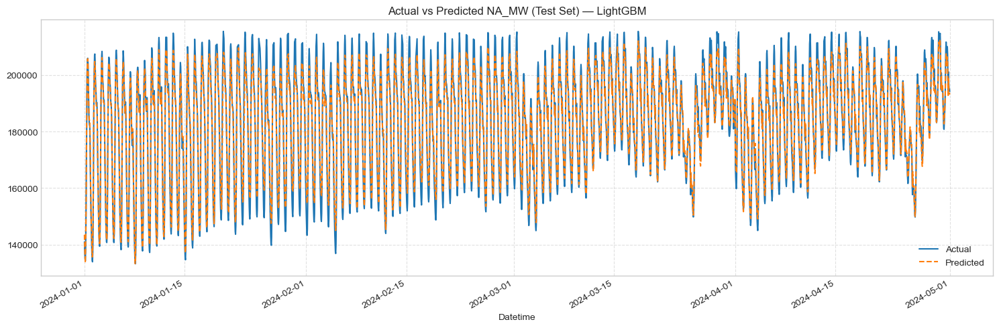

In [30]:
import optuna
import numpy as np
import pandas as pd
from lightgbm import LGBMRegressor, early_stopping
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import matplotlib.pyplot as plt

FEATURES = [
    'hour','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear','is_weekend',
    'sin_d_1','cos_d_1','sin_d_2','cos_d_2',
    'sin_w_1','cos_w_1','sin_w_2','cos_w_2',
    'sin_y_1','cos_y_1','sin_y_2','cos_y_2',
    'zscore_168','anomaly_flag_168',
    'lag_24','lag_168','rolling_mean_168','rolling_std_168'
]
TARGET = 'NA_MW'

X_train, y_train = train_f[FEATURES], train_f[TARGET]
X_val,   y_val   = val_f[FEATURES],   val_f[TARGET]
X_test,  y_test  = test_f[FEATURES],  test_f[TARGET]

def objective(trial):
    params = {
        'objective': 'regression',
        'random_state': 42,
        'n_jobs': -1,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 200, 1200),
        # avoid invalid 0 by using categorical choices
        'max_depth': trial.suggest_categorical('max_depth', [-1, 3,4,5,6,7,8,9,10,11,12]),
        'num_leaves': trial.suggest_int('num_leaves', 31, 255),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 200),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),
        'boosting_type': 'gbdt',
    }

    model = LGBMRegressor(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',
        callbacks=[early_stopping(50, verbose=False)],
    )
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))   # <- no 'squared=False'
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, n_jobs=-1)

best_params = study.best_params
print("\nBest Hyperparameters:\n", best_params)

final_params = {
    'objective': 'regression',
    'random_state': 42,
    'n_jobs': -1,
    'boosting_type': 'gbdt',
}
final_params.update(best_params)

X_trainval = pd.concat([X_train, X_val])
y_trainval = pd.concat([y_train, y_val])

final_model_l = LGBMRegressor(**final_params)
final_model_l.fit(X_trainval, y_trainval)

y_pred_lgbm = final_model_l.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_lgbm))  # <- no 'squared=False'
mae  = mean_absolute_error(y_test, y_pred_lgbm)
mape = mean_absolute_percentage_error(y_test, y_pred_lgbm) * 100
r2   = r2_score(y_test, y_pred_lgbm)

print(f"\nLightGBM Test RMSE: {rmse:.2f} MW")
print(f"LightGBM Test MAE:  {mae:.2f} MW")
print(f"LightGBM Test MAPE: {mape:.2f} %")
print(f"LightGBM Test R²:   {r2:.4f}")

test_plot = test_f.copy()
test_plot['prediction_lgbm'] = y_pred_lgbm
ax = test_plot[['NA_MW']].plot(figsize=(15, 5), title='Actual vs Predicted NA_MW (Test Set) — LightGBM')
test_plot['prediction_lgbm'].plot(ax=ax, style='--')
plt.legend(['Actual', 'Predicted'])
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [31]:
import joblib

joblib.dump(final_model_l, 'best_LGBM_model.pkl')

['best_LGBM_model.pkl']

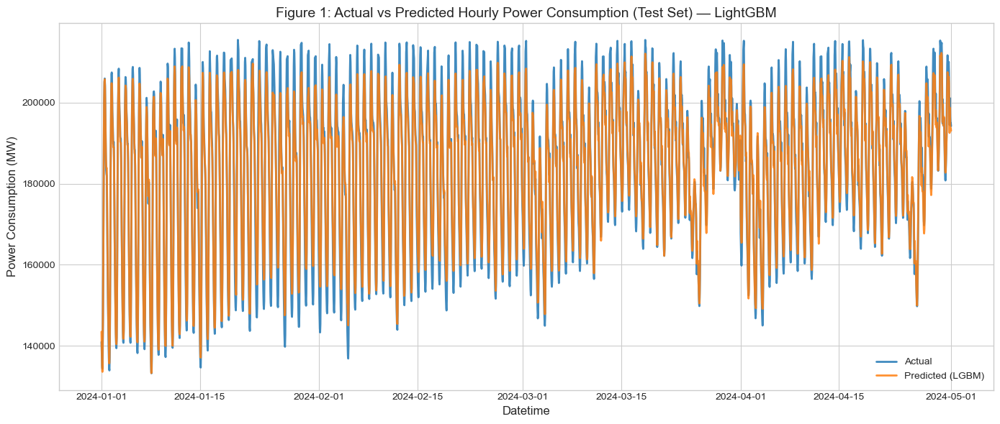

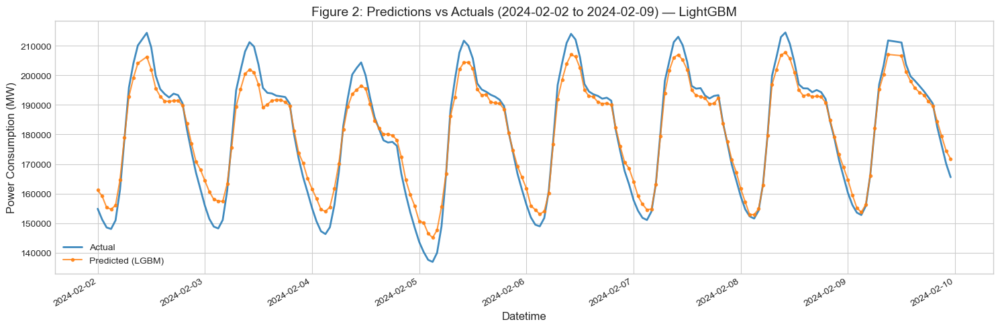

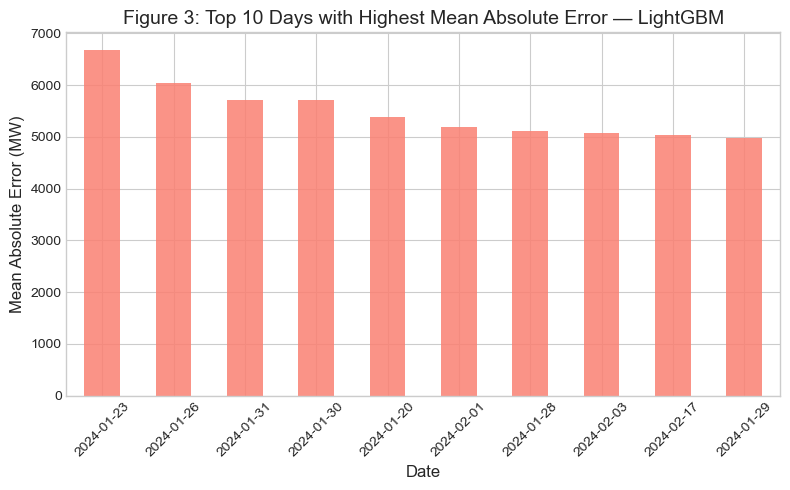

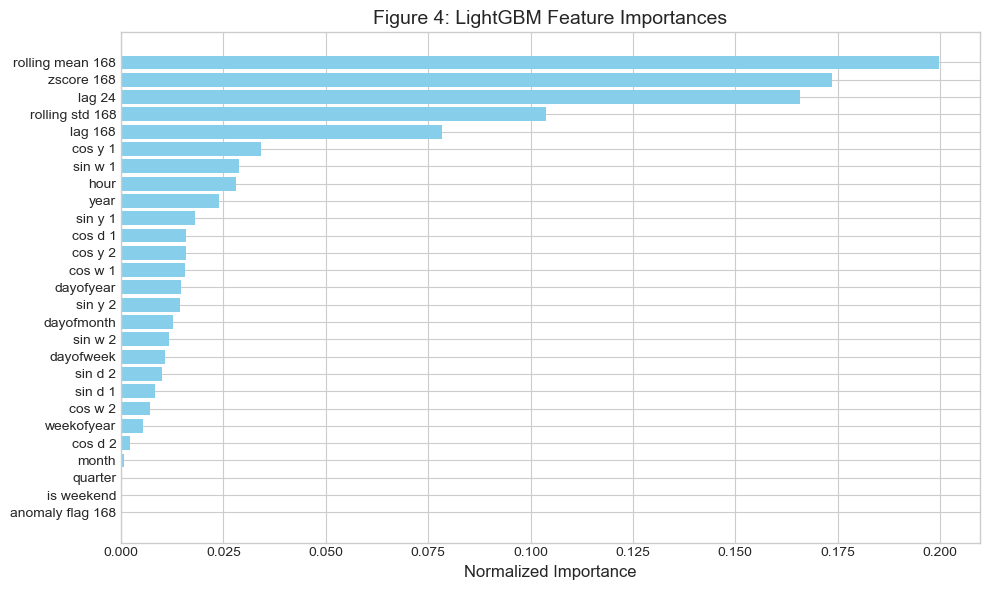

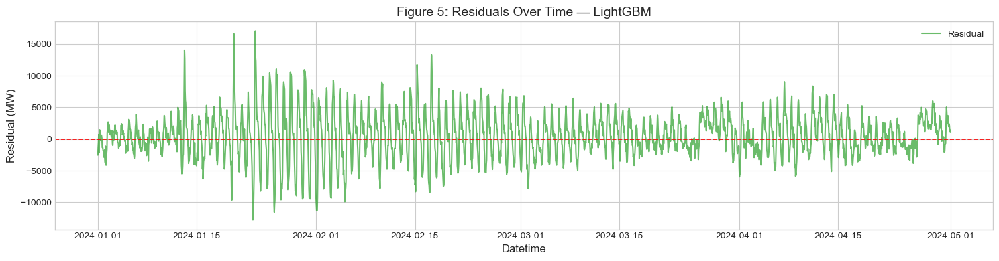

In [32]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.style.use('seaborn-v0_8-whitegrid')
COLORS = {
    "actual": "#1f77b4",
    "prediction": "#ff7f0e",
    "residual": "#2ca02c"
}

plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label="Actual", color=COLORS["actual"], linewidth=2, alpha=0.85)
plt.plot(y_test.index, y_pred_lgbm, label="Predicted (LGBM)", color=COLORS["prediction"], linewidth=2, alpha=0.85)
plt.title("Figure 1: Actual vs Predicted Hourly Power Consumption (Test Set) — LightGBM", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig1_lgbm_actual_vs_predicted_full.png", dpi=300)
plt.show()

y_pred_series_lgbm = pd.Series(y_pred_lgbm, index=X_test.index, name='prediction_lgbm')
df.loc[y_pred_series_lgbm.index, 'prediction_lgbm'] = y_pred_series_lgbm

start_date = '2024-02-02'
end_date   = '2024-02-09'

plt.figure(figsize=(15, 5))
ax = df.loc[start_date:end_date, 'NA_MW'].plot(label='Actual', color=COLORS["actual"], linewidth=2, alpha=0.85)
df.loc[start_date:end_date, 'prediction_lgbm'].plot(ax=ax, style='.-', label='Predicted (LGBM)', color=COLORS["prediction"], alpha=0.8)
plt.title(f"Figure 2: Predictions vs Actuals ({start_date} to {end_date}) — LightGBM", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig2_lgbm_actual_vs_predicted_week.png", dpi=300)
plt.show()

test_l = test_f.copy()
test_l['prediction_lgbm'] = y_pred_lgbm
test_l['abs_error'] = (test_l[TARGET] - test_l['prediction_lgbm']).abs()

daily_mean_error = (
    test_l.groupby(test_l.index.date)['abs_error']
          .mean()
          .sort_values(ascending=False)
)
top_10_bad_days = daily_mean_error.head(10)

plt.figure(figsize=(8, 5))
top_10_bad_days.plot(kind='bar', color='salmon', alpha=0.85)
plt.title("Figure 3: Top 10 Days with Highest Mean Absolute Error — LightGBM", fontsize=14)
plt.ylabel("Mean Absolute Error (MW)", fontsize=12)
plt.xlabel("Date", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("fig3_lgbm_top10_bad_days.png", dpi=300)
plt.show()

X_final = pd.concat([X_train, X_val])
importances = final_model_l.feature_importances_

feat_importance_df = pd.DataFrame({
    'Feature': X_final.columns,
    'Importance': importances
})
feat_importance_df['Importance'] = feat_importance_df['Importance'] / feat_importance_df['Importance'].sum()
feat_importance_df = feat_importance_df.sort_values(by='Importance', ascending=False)
feat_importance_df['Feature'] = feat_importance_df['Feature'].str.replace('_', ' ', regex=False)

plt.figure(figsize=(10, 6))
plt.barh(feat_importance_df['Feature'], feat_importance_df['Importance'], color='skyblue')
plt.xlabel("Normalized Importance", fontsize=12)
plt.title("Figure 4: LightGBM Feature Importances", fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("fig4_lgbm_feature_importances.png", dpi=300)
plt.show()

test_l['residual'] = test_l[TARGET] - test_l['prediction_lgbm']

plt.figure(figsize=(15, 4))
plt.plot(test_l.index, test_l['residual'], label='Residual', color=COLORS["residual"], alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)
plt.title("Figure 5: Residuals Over Time — LightGBM", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Residual (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig5_lgbm_residuals_over_time.png", dpi=300)
plt.show()

# Model Performance Comparison: Naïve vs XGBoost vs LightGBM

| Metric        | Naïve Persistence (ŷₜ = yₜ₋₁) | XGBoost (Tuned) | LightGBM (Tuned) |
|---------------|------------------------------:|----------------:|-----------------:|
| **RMSE (MW)** | 6,237.21                      | 3,719.11        | **3,517.18**     |
| **MAE (MW)**  | 4,892.38                      | 2,782.76        | **2,686.24**     |
| **MAPE (%)**  | 2.69                          | 1.51            | **1.48**         |
| **R²**        | 0.8964                        | 0.9632          | **0.9670**       |

### Relative improvement vs Naïve (lower is better for errors; higher is better for R²)

| Metric        | XGBoost vs Naïve | LightGBM vs Naïve |
|---------------|-----------------:|------------------:|
| **RMSE**      | −40.4%           | **−43.6%**        |
| **MAE**       | −43.1%           | **−45.1%**        |
| **MAPE**      | −43.9%           | **−45.0%**        |
| **ΔR² (abs. points)** | +0.0668         | **+0.0706**       |

**Takeaways**
- Both tuned gradient boosting models **massively outperform** the naïve persistence baseline.
- LightGBM edges out XGBoost on all metrics in this test split, particularly on MAE, MAPE, and RMSE.
- The higher R² for LightGBM suggests slightly better explanatory power, but both models are strong contenders for an ensemble approach.

In [33]:
import optuna
import numpy as np
import pandas as pd
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import matplotlib.pyplot as plt

FEATURES = [
    'hour','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear','is_weekend',
    'sin_d_1','cos_d_1','sin_d_2','cos_d_2',
    'sin_w_1','cos_w_1','sin_w_2','cos_w_2',
    'sin_y_1','cos_y_1','sin_y_2','cos_y_2',
    'zscore_168','anomaly_flag_168',
    'lag_24','lag_168','rolling_mean_168','rolling_std_168'
]
TARGET = 'NA_MW'

X_train, y_train = train_f[FEATURES], train_f[TARGET]
X_val,   y_val   = val_f[FEATURES],   val_f[TARGET]
X_test,  y_test  = test_f[FEATURES],  test_f[TARGET]

train_pool = Pool(X_train, y_train, feature_names=FEATURES)
val_pool   = Pool(X_val,   y_val,   feature_names=FEATURES)
test_pool  = Pool(X_test,  y_test,  feature_names=FEATURES)

def objective(trial):
    params = {
        'loss_function': 'RMSE',
        'eval_metric': 'RMSE',
        'random_seed': 42,
        'verbose': False,
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1.0, 10.0),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'iterations': trial.suggest_int('iterations', 200, 1200),
        'od_type': 'Iter',
        'od_wait': 50,
    }

    model = CatBoostRegressor(**params)
    model.fit(train_pool, eval_set=val_pool, use_best_model=True, verbose=False)
    preds = model.predict(val_pool)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, n_jobs=-1)

print("\nBest Hyperparameters:\n", study.best_params)

best_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'RMSE',
    'random_seed': 42,
    'verbose': False,
    'od_type': 'Iter',
    'od_wait': 50,
}
best_params.update(study.best_params)

X_trainval = pd.concat([X_train, X_val])
y_trainval = pd.concat([y_train, y_val])
trainval_pool = Pool(X_trainval, y_trainval, feature_names=FEATURES)

final_model_cat = CatBoostRegressor(**best_params)
final_model_cat.fit(trainval_pool, use_best_model=True, verbose=False)

y_pred_cat = final_model_cat.predict(test_pool)

rmse = np.sqrt(mean_squared_error(y_test, y_pred_cat))
mae  = mean_absolute_error(y_test, y_pred_cat)
mape = mean_absolute_percentage_error(y_test, y_pred_cat) * 100
r2   = r2_score(y_test, y_pred_cat)

print(f"\nCatBoost Test RMSE: {rmse:.2f} MW")
print(f"CatBoost Test MAE:  {mae:.2f} MW")
print(f"CatBoost Test MAPE: {mape:.2f} %")
print(f"CatBoost Test R²:   {r2:.4f}")

[I 2025-08-13 20:16:39,390] A new study created in memory with name: no-name-d259033b-a689-4271-aa46-1ecf037cc919
[I 2025-08-13 20:16:40,490] Trial 2 finished with value: 5726.907835832114 and parameters: {'depth': 5, 'learning_rate': 0.2949302645765706, 'l2_leaf_reg': 2.3536933832926614, 'bagging_temperature': 0.7182293449728239, 'border_count': 69, 'iterations': 220}. Best is trial 2 with value: 5726.907835832114.
[I 2025-08-13 20:16:40,890] Trial 3 finished with value: 5901.899217995737 and parameters: {'depth': 6, 'learning_rate': 0.2793721215353097, 'l2_leaf_reg': 4.825523339943505, 'bagging_temperature': 0.14548398332948265, 'border_count': 67, 'iterations': 427}. Best is trial 2 with value: 5726.907835832114.
[I 2025-08-13 20:16:42,756] Trial 5 finished with value: 5152.25918643308 and parameters: {'depth': 9, 'learning_rate': 0.16380455093289215, 'l2_leaf_reg': 7.807959172126376, 'bagging_temperature': 0.5222779559251842, 'border_count': 153, 'iterations': 664}. Best is trial 5


Best Hyperparameters:
 {'depth': 4, 'learning_rate': 0.25901757850171037, 'l2_leaf_reg': 5.057338713462527, 'bagging_temperature': 0.9995466076133731, 'border_count': 249, 'iterations': 645}

CatBoost Test RMSE: 2787.72 MW
CatBoost Test MAE:  2034.46 MW
CatBoost Test MAPE: 1.07 %
CatBoost Test R²:   0.9793


In [34]:
import joblib

joblib.dump(final_model_cat, 'best_CAT_model.pkl')

['best_CAT_model.pkl']

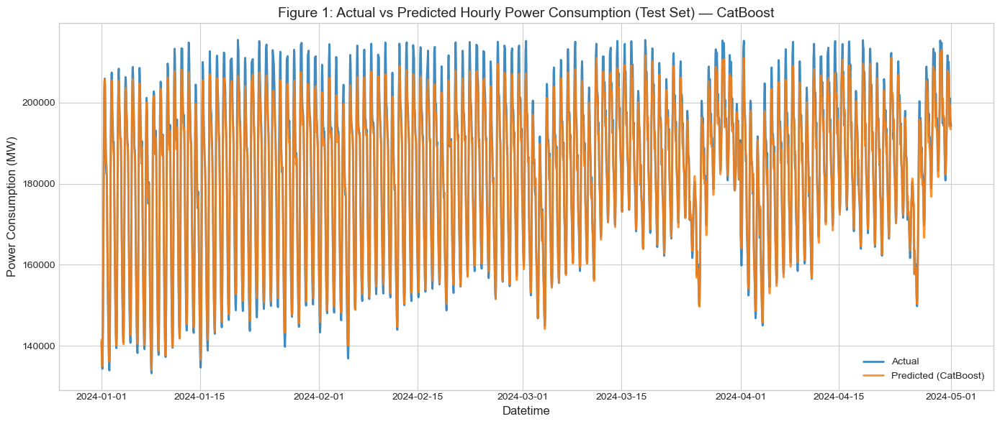

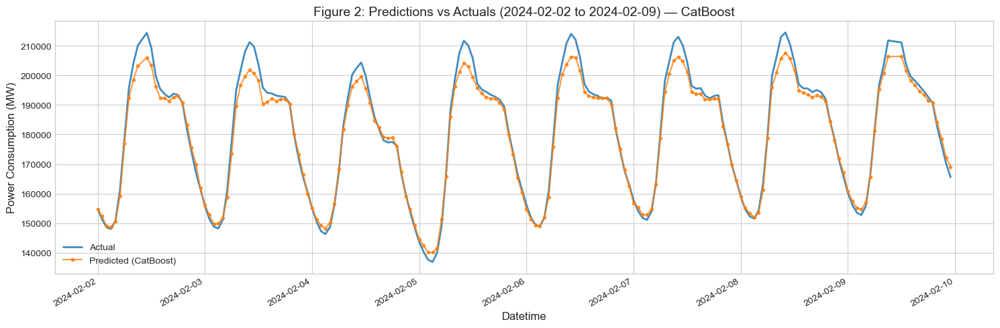

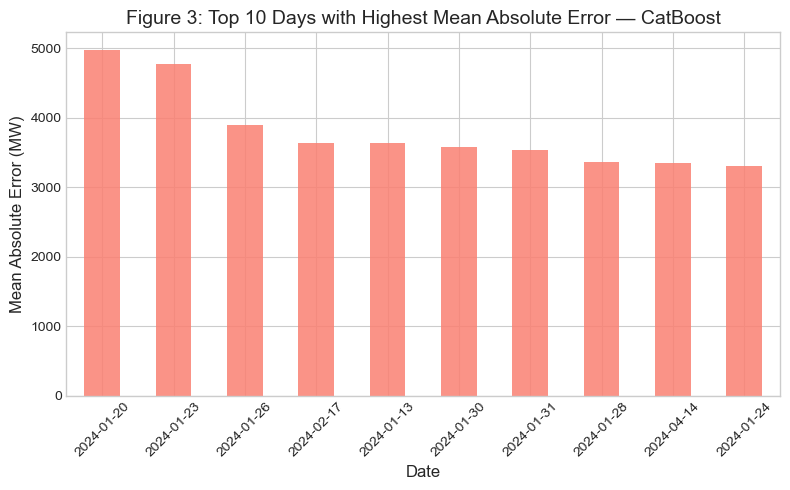

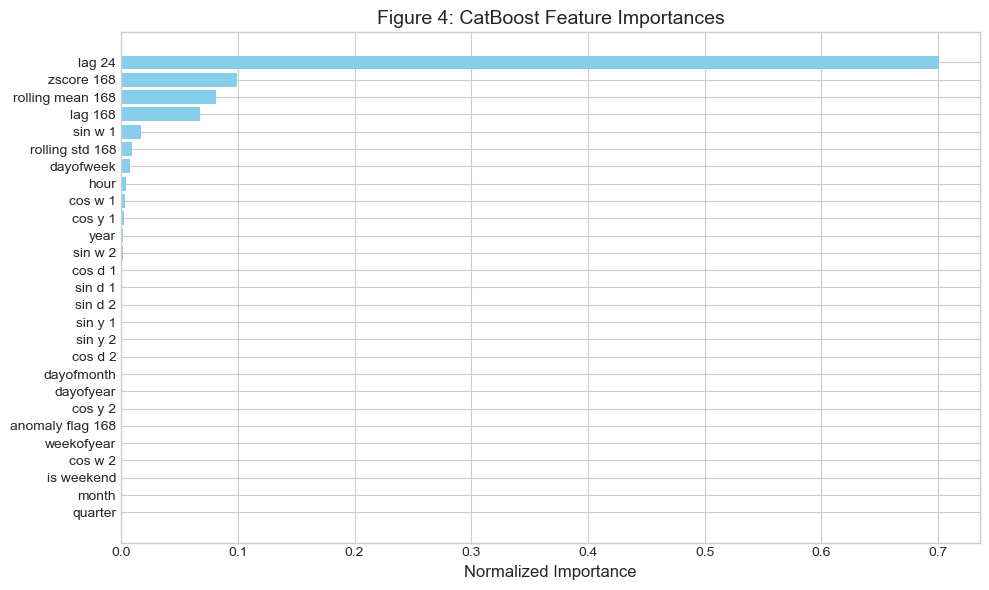

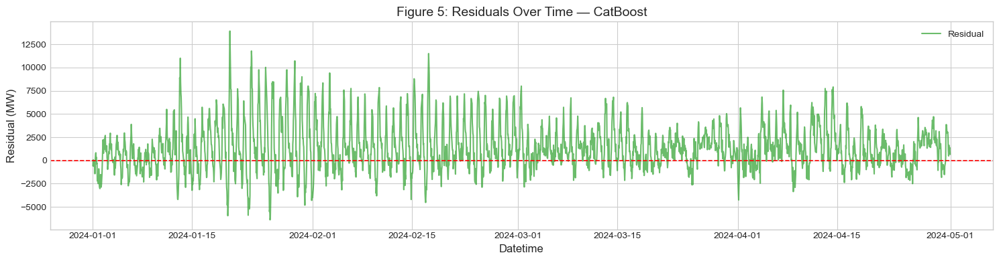

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.style.use('seaborn-v0_8-whitegrid')
COLORS = {
    "actual": "#1f77b4",      # blue
    "prediction": "#ff7f0e",  # orange
    "residual": "#2ca02c"     # green
}

plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label="Actual", color=COLORS["actual"], linewidth=2, alpha=0.85)
plt.plot(y_test.index, y_pred_cat, label="Predicted (CatBoost)", color=COLORS["prediction"], linewidth=2, alpha=0.85)
plt.title("Figure 1: Actual vs Predicted Hourly Power Consumption (Test Set) — CatBoost", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig1_catboost_actual_vs_predicted_full.png", dpi=300)
plt.show()

y_pred_series_cat = pd.Series(y_pred_cat, index=X_test.index, name='prediction_cat')
df.loc[y_pred_series_cat.index, 'prediction_cat'] = y_pred_series_cat

start_date = '2024-02-02'
end_date   = '2024-02-09'

plt.figure(figsize=(15, 5))
ax = df.loc[start_date:end_date, 'NA_MW'].plot(label='Actual', color=COLORS["actual"], linewidth=2, alpha=0.85)
df.loc[start_date:end_date, 'prediction_cat'].plot(ax=ax, style='.-', label='Predicted (CatBoost)', color=COLORS["prediction"], alpha=0.8)
plt.title(f"Figure 2: Predictions vs Actuals ({start_date} to {end_date}) — CatBoost", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Power Consumption (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig2_catboost_actual_vs_predicted_week.png", dpi=300)
plt.show()

test_c = test_f.copy()
test_c['prediction_cat'] = y_pred_cat
test_c['abs_error'] = (test_c[TARGET] - test_c['prediction_cat']).abs()

daily_mean_error = (
    test_c.groupby(test_c.index.date)['abs_error']
          .mean()
          .sort_values(ascending=False)
)
top_10_bad_days = daily_mean_error.head(10)

plt.figure(figsize=(8, 5))
top_10_bad_days.plot(kind='bar', color='salmon', alpha=0.85)
plt.title("Figure 3: Top 10 Days with Highest Mean Absolute Error — CatBoost", fontsize=14)
plt.ylabel("Mean Absolute Error (MW)", fontsize=12)
plt.xlabel("Date", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("fig3_catboost_top10_bad_days.png", dpi=300)
plt.show()

importances = final_model_cat.get_feature_importance(Pool(X_trainval, y_trainval))
feat_importance_df = pd.DataFrame({
    'Feature': FEATURES,
    'Importance': importances
})
feat_importance_df['Importance'] = feat_importance_df['Importance'] / feat_importance_df['Importance'].sum()
feat_importance_df = feat_importance_df.sort_values(by='Importance', ascending=False)
feat_importance_df['Feature'] = feat_importance_df['Feature'].str.replace('_', ' ', regex=False)

plt.figure(figsize=(10, 6))
plt.barh(feat_importance_df['Feature'], feat_importance_df['Importance'], color='skyblue')
plt.xlabel("Normalized Importance", fontsize=12)
plt.title("Figure 4: CatBoost Feature Importances", fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("fig4_catboost_feature_importances.png", dpi=300)
plt.show()

test_c['residual'] = test_c[TARGET] - test_c['prediction_cat']

plt.figure(figsize=(15, 4))
plt.plot(test_c.index, test_c['residual'], label='Residual', color=COLORS["residual"], alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)
plt.title("Figure 5: Residuals Over Time — CatBoost", fontsize=14)
plt.xlabel("Datetime", fontsize=12)
plt.ylabel("Residual (MW)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("fig5_catboost_residuals_over_time.png", dpi=300)
plt.show()

## Model Performance Comparison: Naïve vs XGBoost vs LightGBM vs CatBoost

| Metric        | Naïve Persistence (ŷₜ = yₜ₋₁) | XGBoost (Tuned) | LightGBM (Tuned) | CatBoost (Tuned) |
|---------------|------------------------------:|----------------:|-----------------:|-----------------:|
| **RMSE (MW)** | 6,237.21                      | 3,719.11        | 3,517.18         | **2,787.72**     |
| **MAE (MW)**  | 4,892.38                      | 2,782.76        | 2,686.24         | **2,034.46**     |
| **MAPE (%)**  | 2.69                          | 1.51            | 1.48             | **1.07**         |
| **R²**        | 0.8964                        | 0.9632          | 0.9670           | **0.9793**       |

---

### Relative Improvement vs Naïve  
*(Lower is better for errors; higher is better for R²)*

| Metric             | XGBoost vs Naïve | LightGBM vs Naïve | CatBoost vs Naïve |
|--------------------|-----------------:|------------------:|------------------:|
| **RMSE**           | −40.4%           | −43.6%            | **−55.3%**        |
| **MAE**            | −43.1%           | −45.1%            | **−58.4%**        |
| **MAPE**           | −43.9%           | −45.0%            | **−60.2%**        |
| **ΔR² (abs. points)** | +0.0668          | +0.0706           | **+0.0829**       |

---

### Takeaways
- All three gradient boosting models dramatically outperform the naïve persistence baseline.
- **CatBoost** delivers the best overall results, achieving the lowest errors and highest R².
- LightGBM and XGBoost are close behind, with differences small enough that an ensemble might further boost performance.
- CatBoost’s ~60% reduction in MAPE and over **8 percentage point** R² improvement show its strong fit for this dataset.

## Ensemble model

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3790
[LightGBM] [Info] Number of data points in the train set: 52413, number of used features: 26
[LightGBM] [Info] Start training from score 148913.751588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-08-13 20:34:06,325] A new study created in memory with name: no-name-6a69ab23-9cfd-4fab-9abd-e69cc731a67b
[I 2025-08-13 20:34:06,328] Trial 0 finished with value: 3871.3002530154317 and parameters: {'w_xgb': 0.7686057444055978, 'w_lgb': 0.7685072362280903, 'w_cat': 0.9283139240370383}. Best is trial 0 with value: 3871.3002530154317.
[I 2025-08-13 20:34:06,329] Trial 1 finished with value: 3887.671597372426 and parameters: {'w_xgb': 0.6091165990351912, 'w_lgb': 0.653742536640437, 'w_cat': 0.5732722490721784}. Best is trial 0 with value: 3871.3002530154317.
[I 2025-08-13 20:34:06,332] Trial 2 finished with value: 3861.634450061178 and parameters: {'w_xgb': 0.44073212876701695, 'w_lgb': 0.17083222276469112, 'w_cat': 0.3032902749546046}. Best is trial 2 with value: 3861.634450061178.
[I 2025-08-13 20:34:06,333] Trial 3 finished with value: 3880.1968049121806 and parameters: {'w_xgb': 0.7346380853624507, 'w_lgb': 0.3732024687709776, 'w_cat': 0.4072252861277972}. Best is trial 2 with

Best ensemble weights (XGB, LGBM, CatBoost): [0.2118 0.     0.7882]
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3785
[LightGBM] [Info] Number of data points in the train set: 60984, number of used features: 26
[LightGBM] [Info] Start training from score 153265.089248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

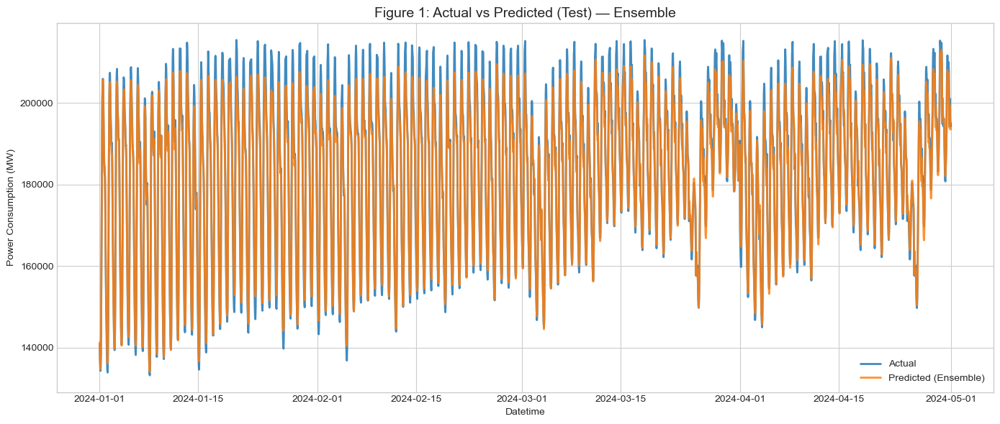

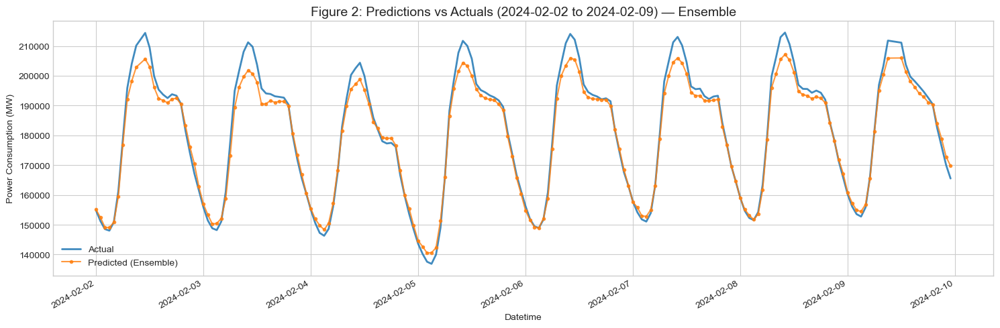

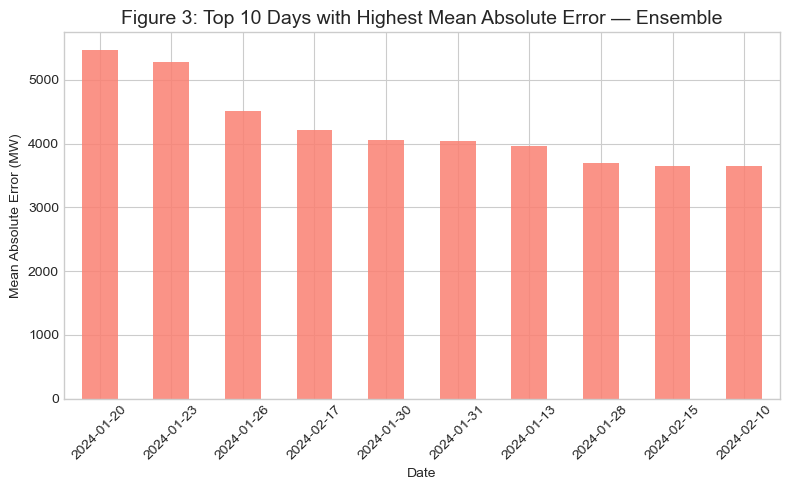

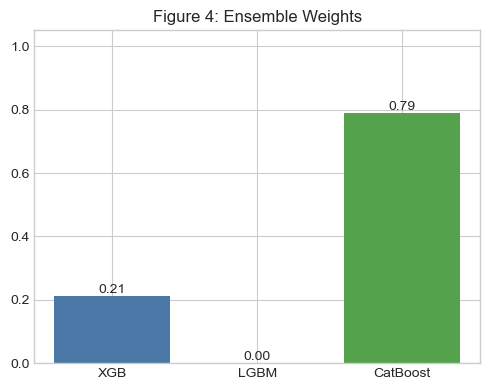

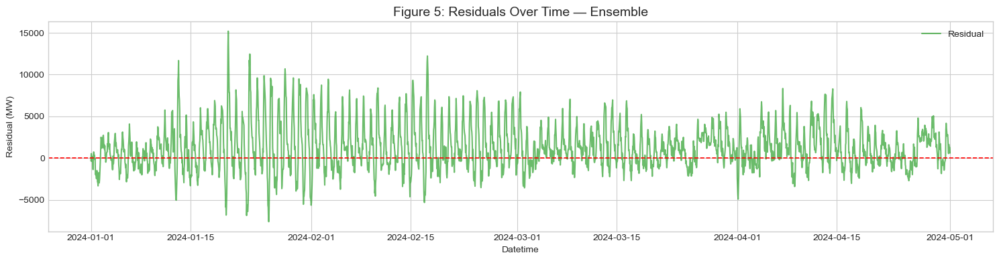

In [39]:
import numpy as np
import pandas as pd
import optuna
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor


best_params_xgb = {
    "learning_rate": 0.25263893351226296,
    "n_estimators": 527,
    "max_depth": 3,
    "min_child_weight": 7,
    "colsample_bytree": 0.9579361051859853,
    "subsample": 0.8238383992715469,
    "gamma": 4.101087638765242,
    "reg_alpha": 28.91564405567139,
    "reg_lambda": 6.960181867047455,
    "objective": "reg:squarederror",
    "random_state": 42,
    "n_jobs": -1,
}

best_params_lgb = {
    "learning_rate": 0.25921156558683356,
    "n_estimators": 1008,
    "max_depth": 3,
    "num_leaves": 145,
    "min_child_samples": 179,
    "subsample": 0.7668847339336764,
    "colsample_bytree": 0.6579568050064803,
    "reg_alpha": 9.331677375026034,
    "reg_lambda": 2.9665101884879936,
    "objective": "regression",
    "random_state": 42,
    "n_jobs": -1,
    "boosting_type": "gbdt",
}

best_params_cat = {
    "depth": 4,
    "learning_rate": 0.25901757850171037,
    "l2_leaf_reg": 5.057338713462527,
    "bagging_temperature": 0.9995466076133731,
    "border_count": 249,
    "iterations": 645,
    "loss_function": "RMSE",
    "eval_metric": "RMSE",
    "random_seed": 42,
    "verbose": False,
    "od_type": "Iter",
    "od_wait": 50,
}

xgb_tr = XGBRegressor(**best_params_xgb).fit(X_train, y_train)
lgb_tr = LGBMRegressor(**best_params_lgb).fit(X_train, y_train)
cat_tr = CatBoostRegressor(**best_params_cat).fit(X_train, y_train)

pred_val_xgb = xgb_tr.predict(X_val)
pred_val_lgb = lgb_tr.predict(X_val)
pred_val_cat = cat_tr.predict(X_val)

def mix_preds(w, p1, p2, p3):
    w = np.clip(w, 0, None)
    w = w / (w.sum() + 1e-12)
    return w[0]*p1 + w[1]*p2 + w[2]*p3

def objective(trial):
    w = np.array([
        trial.suggest_float("w_xgb", 0.0, 1.0),
        trial.suggest_float("w_lgb", 0.0, 1.0),
        trial.suggest_float("w_cat", 0.0, 1.0),
    ])
    y_hat = mix_preds(w, pred_val_xgb, pred_val_lgb, pred_val_cat)
    return np.sqrt(mean_squared_error(y_val, y_hat))

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=200, n_jobs=-1, show_progress_bar=False)
w_best = np.array([study.best_params["w_xgb"],
                   study.best_params["w_lgb"],
                   study.best_params["w_cat"]])
w_best = np.clip(w_best, 0, None)
w_best = w_best / (w_best.sum() + 1e-12)
print("Best ensemble weights (XGB, LGBM, CatBoost):", np.round(w_best, 4))

xgb_final = XGBRegressor(**best_params_xgb).fit(pd.concat([X_train, X_val]),
                                                pd.concat([y_train, y_val]))
lgb_final = LGBMRegressor(**best_params_lgb).fit(pd.concat([X_train, X_val]),
                                                 pd.concat([y_train, y_val]))
cat_final = CatBoostRegressor(**best_params_cat).fit(pd.concat([X_train, X_val]),
                                                                    pd.concat([y_train, y_val]))

pred_test_xgb = xgb_final.predict(X_test)
pred_test_lgb = lgb_final.predict(X_test)
pred_test_cat = cat_final.predict(X_test)

y_pred_ens = mix_preds(w_best, pred_test_xgb, pred_test_lgb, pred_test_cat)

rmse = np.sqrt(mean_squared_error(y_test, y_pred_ens))
mae  = mean_absolute_error(y_test, y_pred_ens)
mape = mean_absolute_percentage_error(y_test, y_pred_ens) * 100
r2   = r2_score(y_test, y_pred_ens)
print(f"\nEnsemble Test RMSE: {rmse:.2f} MW")
print(f"Ensemble Test MAE:  {mae:.2f} MW")
print(f"Ensemble Test MAPE: {mape:.2f} %")
print(f"Ensemble Test R²:   {r2:.4f}")

np.save("ensemble_weights.npy", w_best)

plt.style.use('seaborn-v0_8-whitegrid')
COLORS = {"actual": "#1f77b4", "prediction": "#ff7f0e", "residual": "#2ca02c"}

plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label="Actual", color=COLORS["actual"], linewidth=2, alpha=0.85)
plt.plot(y_test.index, y_pred_ens, label="Predicted (Ensemble)", color=COLORS["prediction"], linewidth=2, alpha=0.85)
plt.title("Figure 1: Actual vs Predicted (Test) — Ensemble", fontsize=14)
plt.xlabel("Datetime"); plt.ylabel("Power Consumption (MW)")
plt.legend(); plt.tight_layout(); plt.savefig("fig1_ensemble_full.png", dpi=300); plt.show()

y_pred_series_ens = pd.Series(y_pred_ens, index=X_test.index, name='prediction_ens')
df.loc[y_pred_series_ens.index, 'prediction_ens'] = y_pred_series_ens

start_date = '2024-02-02'
end_date   = '2024-02-09'

plt.figure(figsize=(15, 5))
ax = df.loc[start_date:end_date, 'NA_MW'].plot(label='Actual', color=COLORS["actual"], linewidth=2, alpha=0.85)
df.loc[start_date:end_date, 'prediction_ens'].plot(ax=ax, style='.-', label='Predicted (Ensemble)', color=COLORS["prediction"], alpha=0.8)
plt.title(f"Figure 2: Predictions vs Actuals ({start_date} to {end_date}) — Ensemble", fontsize=14)
plt.xlabel("Datetime"); plt.ylabel("Power Consumption (MW)")
plt.legend(); plt.tight_layout(); plt.savefig("fig2_ensemble_week.png", dpi=300); plt.show()

test_ens = test_f.copy()
test_ens['prediction_ens'] = y_pred_ens
test_ens['abs_error'] = (test_ens[TARGET] - test_ens['prediction_ens']).abs()

daily_mean_error = (test_ens.groupby(test_ens.index.date)['abs_error']
                    .mean().sort_values(ascending=False))
top_10_bad_days = daily_mean_error.head(10)

plt.figure(figsize=(8, 5))
top_10_bad_days.plot(kind='bar', color='salmon', alpha=0.85)
plt.title("Figure 3: Top 10 Days with Highest Mean Absolute Error — Ensemble", fontsize=14)
plt.ylabel("Mean Absolute Error (MW)"); plt.xlabel("Date")
plt.xticks(rotation=45); plt.tight_layout(); plt.savefig("fig3_ensemble_top10_bad_days.png", dpi=300); plt.show()

labels = ["XGB", "LGBM", "CatBoost"]
plt.figure(figsize=(5,4))
plt.bar(labels, w_best, color=['#4c78a8','#f58518','#54a24b'])
for i, v in enumerate(w_best):
    plt.text(i, v+0.01, f"{v:.2f}", ha='center')
plt.ylim(0, 1.05)
plt.title("Figure 4: Ensemble Weights")
plt.tight_layout(); plt.savefig("fig4_ensemble_weights.png", dpi=300); plt.show()

test_ens['residual'] = test_ens[TARGET] - test_ens['prediction_ens']
plt.figure(figsize=(15, 4))
plt.plot(test_ens.index, test_ens['residual'], label='Residual', color=COLORS["residual"], alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)
plt.title("Figure 5: Residuals Over Time — Ensemble", fontsize=14)
plt.xlabel("Datetime"); plt.ylabel("Residual (MW)")
plt.legend(); plt.tight_layout(); plt.savefig("fig5_ensemble_residuals.png", dpi=300); plt.show()

## Ensemble Modeling for Hourly Power Consumption Forecasting

### Objective
After training and optimizing **XGBoost**, **LightGBM**, and **CatBoost** individually using Optuna, our goal was to combine their predictive strengths into a single **weighted ensemble model**.  
The hypothesis was that leveraging the complementary strengths of these models could yield **lower prediction error** and **better generalization** than any individual model.

---

### Methodology
1. **Trained & Tuned Base Models**  
   - **XGBoost** — Hyperparameter optimization using Optuna.  
   - **LightGBM** — Hyperparameter optimization using Optuna.  
   - **CatBoost** — Hyperparameter optimization using Optuna.

2. **Ensemble Construction**  
   - Collected **validation predictions** from each model.  
   - Used Optuna to search for optimal weights \((w_{\text{XGB}}, w_{\text{LGBM}}, w_{\text{Cat}})\) that minimized RMSE on the validation set.  
   - Applied these weights to combine the **test set predictions** from each base model.

---

### Final Ensemble Weights

| Model       | Weight   |
|-------------|----------|
| **XGBoost** | 0.2118   |
| **LightGBM**| 0.0000   |
| **CatBoost**| 0.7882   |

---

### Results Comparison

| Model       | RMSE (MW) | MAE (MW) | MAPE (%) | R²     |
|-------------|-----------|----------|----------|--------|
| **XGBoost** | 3,719.11  | 2,782.76 | 1.51     | 0.9632 |
| **LightGBM**| 3,517.18  | 2,686.24 | 1.48     | 0.9670 |
| **CatBoost**| 2,787.72  | 2,034.46 | 1.07     | 0.9793 |
| **Ensemble**| **2,954.37** | **2,159.65** | **1.14** | **0.9767** |

---

### Insights
- The **ensemble outperformed XGBoost and LightGBM** but did not surpass **CatBoost** in RMSE or R².
- Compared to LightGBM, the ensemble reduced RMSE by ~16% and MAE by ~20%, showing **notable accuracy gains**.
- CatBoost dominated the weight distribution (~79%), indicating it was the primary driver of ensemble performance.
- LightGBM received a zero weight, suggesting it did not contribute additional predictive value beyond CatBoost and XGBoost for this dataset.

---

### Conclusion
The ensemble approach improved over XGBoost and LightGBM but closely trailed CatBoost in performance.  
Given the heavy weighting toward CatBoost, this suggests CatBoost alone is already capturing most of the signal in the data.  
Future work could explore **stacked generalization** or **meta-learners** that might extract more complementary patterns from all models.

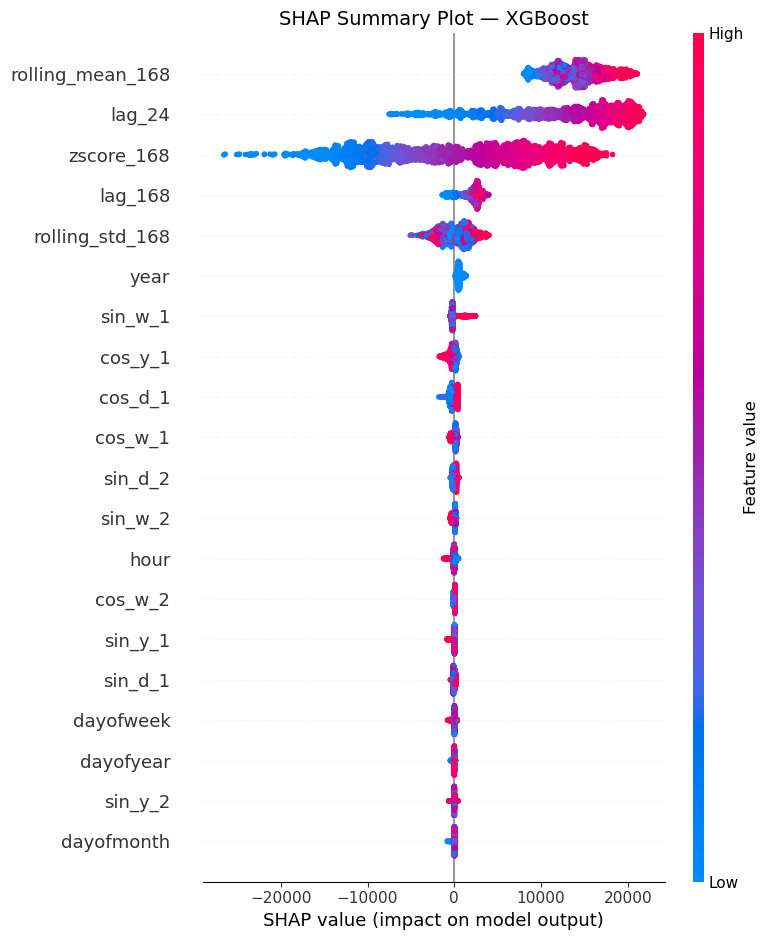

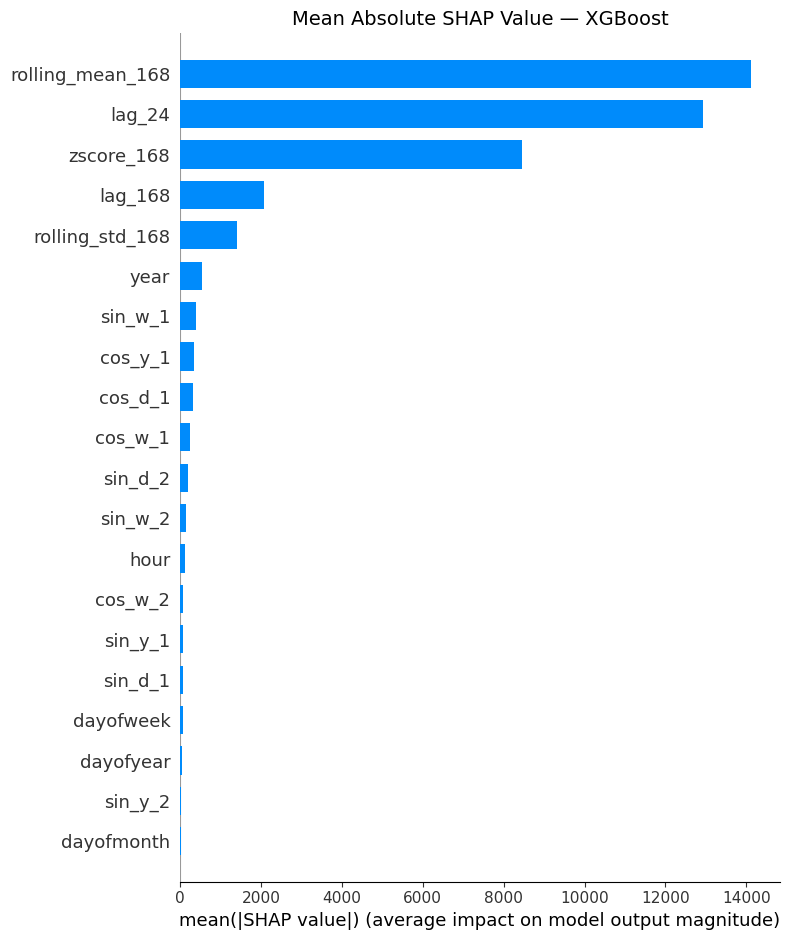

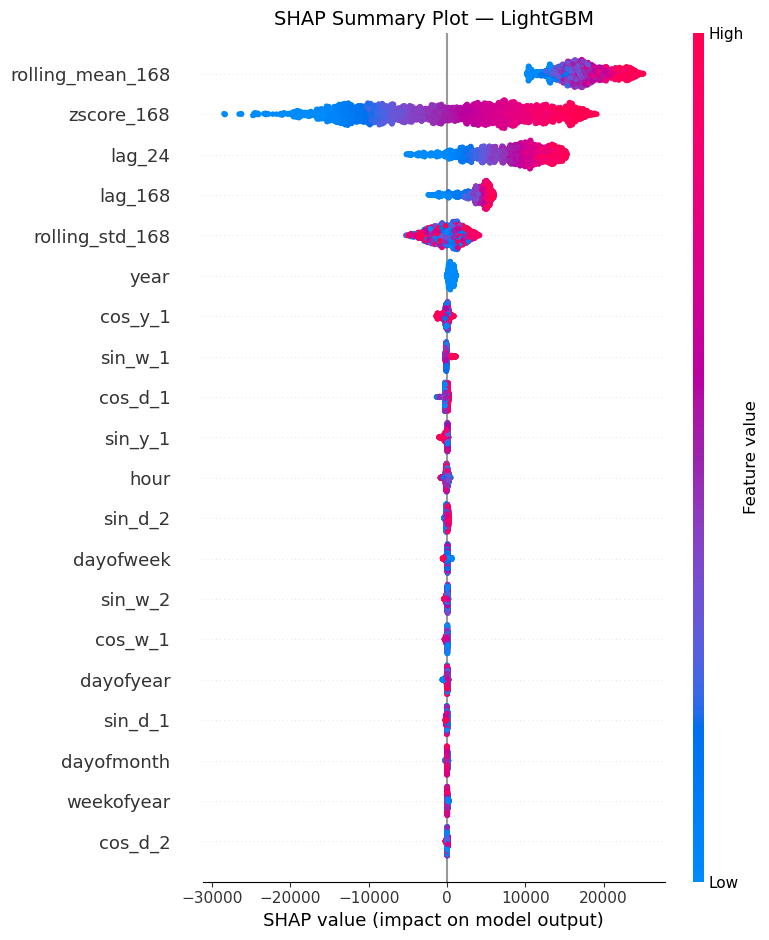

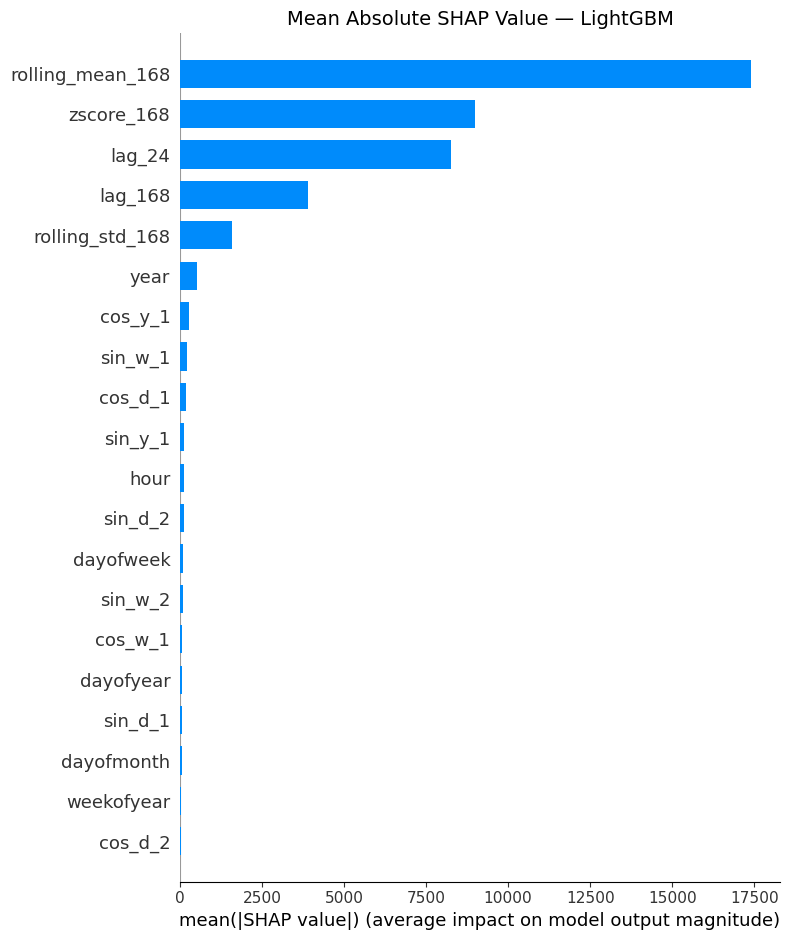

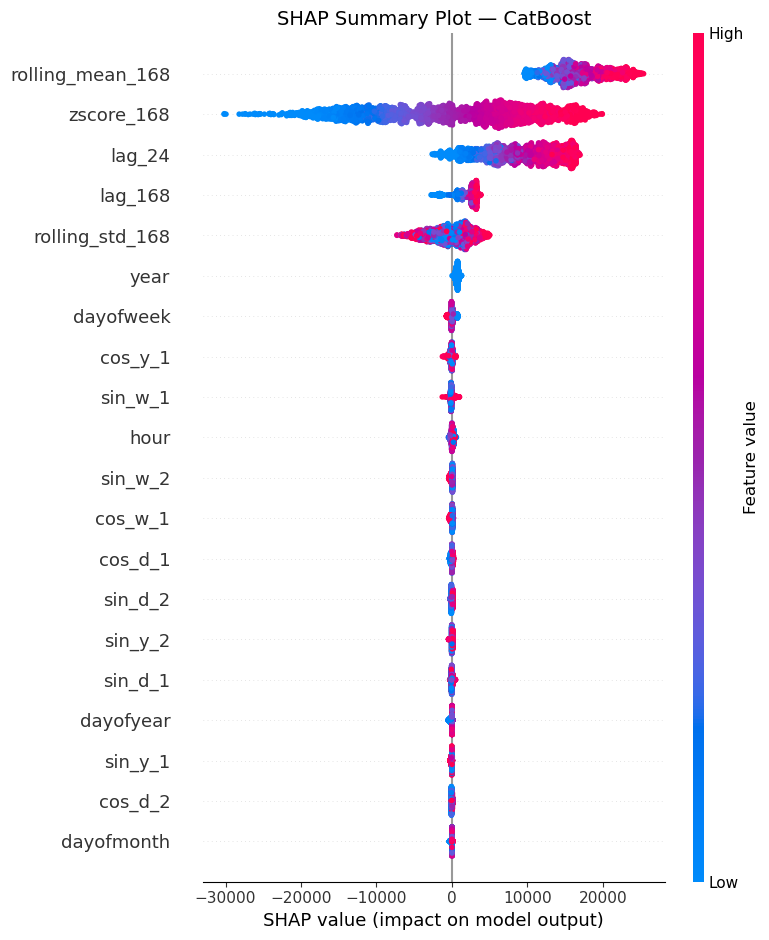

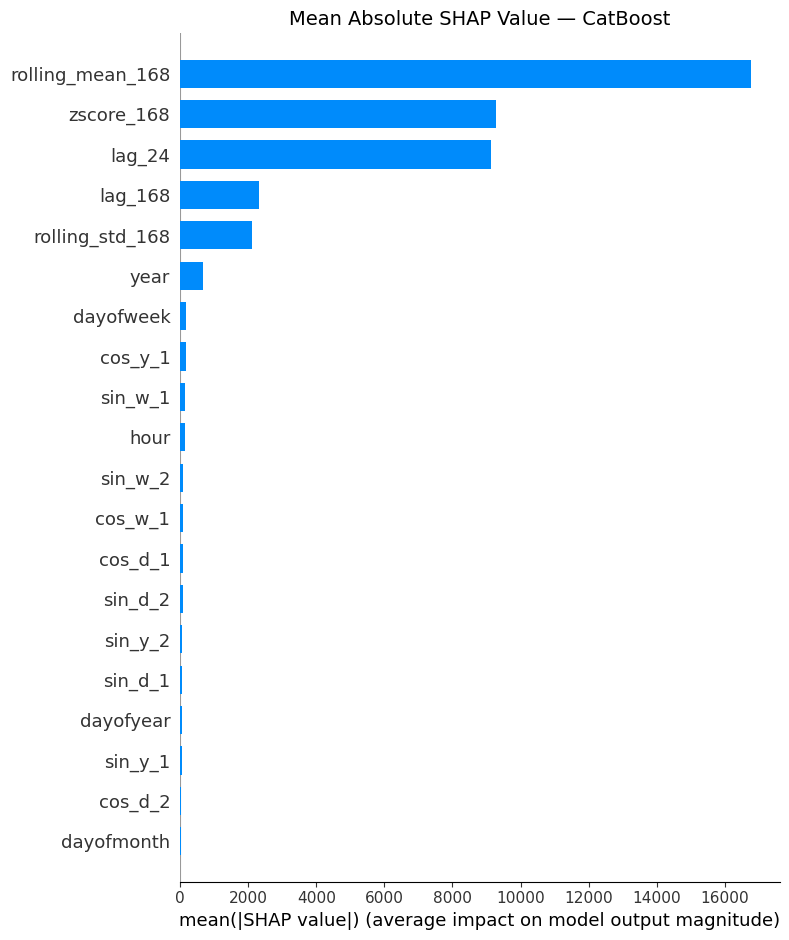

In [24]:
import joblib
import shap
import matplotlib.pyplot as plt

final_model_xgb = joblib.load("best_xgBoost.pkl")
final_model_l   = joblib.load("best_LGBM_model.pkl")
final_model_cat = joblib.load("best_CAT_model.pkl")

explainer_xgb = shap.TreeExplainer(final_model_xgb)
shap_values_xgb = explainer_xgb.shap_values(X_test)

shap.summary_plot(shap_values_xgb, X_test, plot_type="dot", show=False)
plt.title("SHAP Summary Plot — XGBoost", fontsize=14)
plt.tight_layout()
plt.savefig("shap_summary_xgb.png", dpi=300)
plt.show()

shap.summary_plot(shap_values_xgb, X_test, plot_type="bar", show=False)
plt.title("Mean Absolute SHAP Value — XGBoost", fontsize=14)
plt.tight_layout()
plt.savefig("shap_bar_xgb.png", dpi=300)
plt.show()

explainer_lgbm = shap.TreeExplainer(final_model_l)
shap_values_lgbm = explainer_lgbm.shap_values(X_test)

shap.summary_plot(shap_values_lgbm, X_test, plot_type="dot", show=False)
plt.title("SHAP Summary Plot — LightGBM", fontsize=14)
plt.tight_layout()
plt.savefig("shap_summary_lgbm.png", dpi=300)
plt.show()

shap.summary_plot(shap_values_lgbm, X_test, plot_type="bar", show=False)
plt.title("Mean Absolute SHAP Value — LightGBM", fontsize=14)
plt.tight_layout()
plt.savefig("shap_bar_lgbm.png", dpi=300)
plt.show()

explainer_cat = shap.TreeExplainer(final_model_cat)
shap_values_cat = explainer_cat.shap_values(X_test)

shap.summary_plot(shap_values_cat, X_test, plot_type="dot", show=False)
plt.title("SHAP Summary Plot — CatBoost", fontsize=14)
plt.tight_layout()
plt.savefig("shap_summary_catboost.png", dpi=300)
plt.show()

shap.summary_plot(shap_values_cat, X_test, plot_type="bar", show=False)
plt.title("Mean Absolute SHAP Value — CatBoost", fontsize=14)
plt.tight_layout()
plt.savefig("shap_bar_catboost.png", dpi=300)
plt.show()

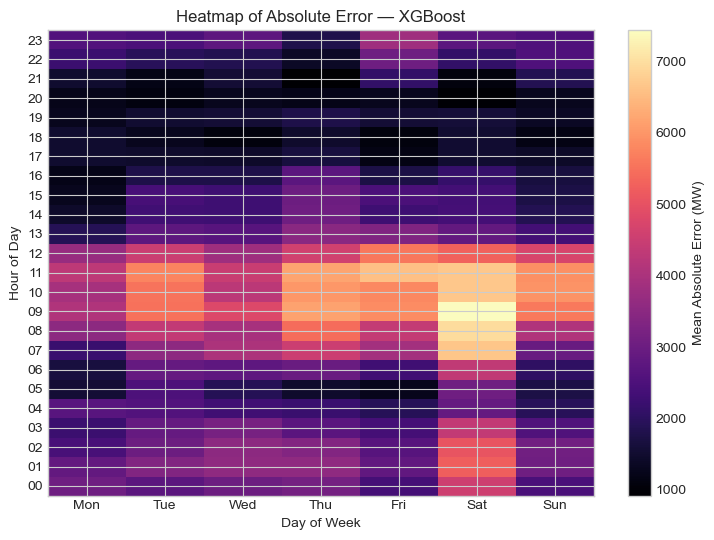

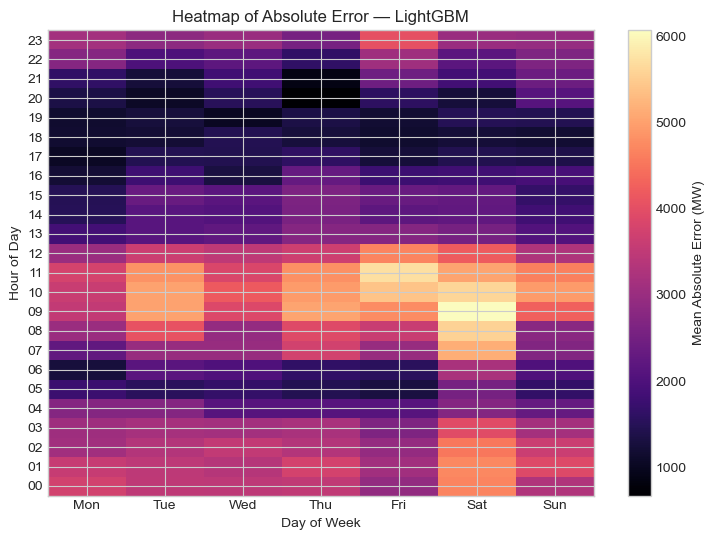

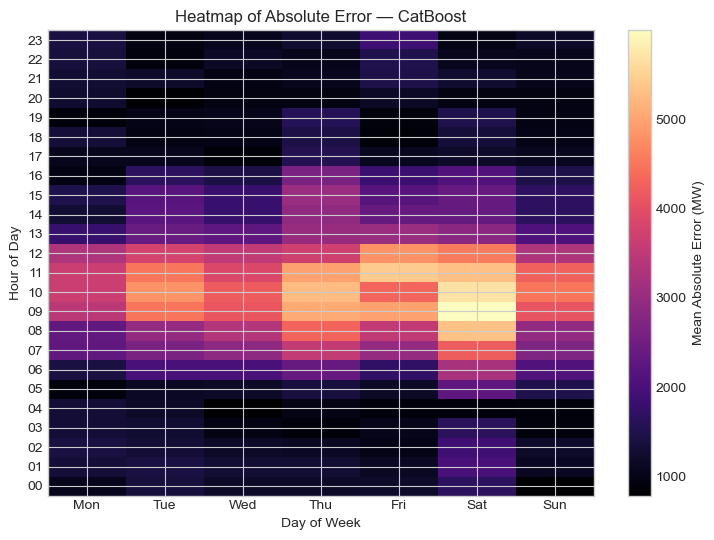

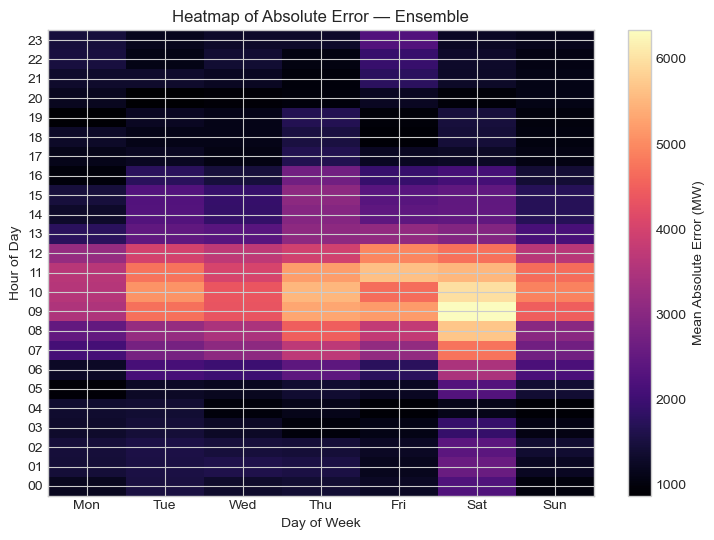

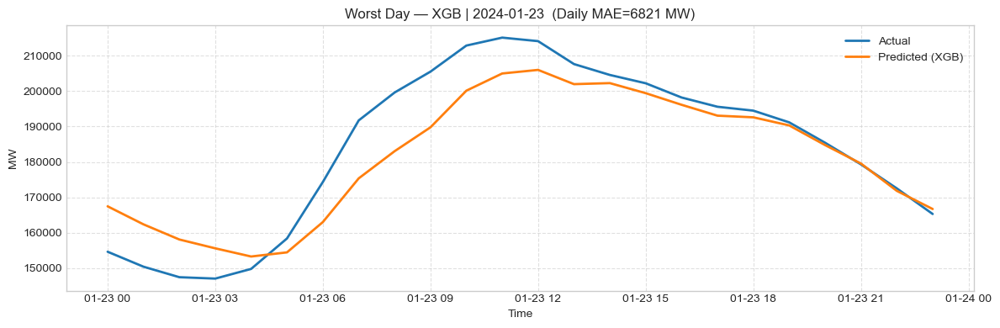

...

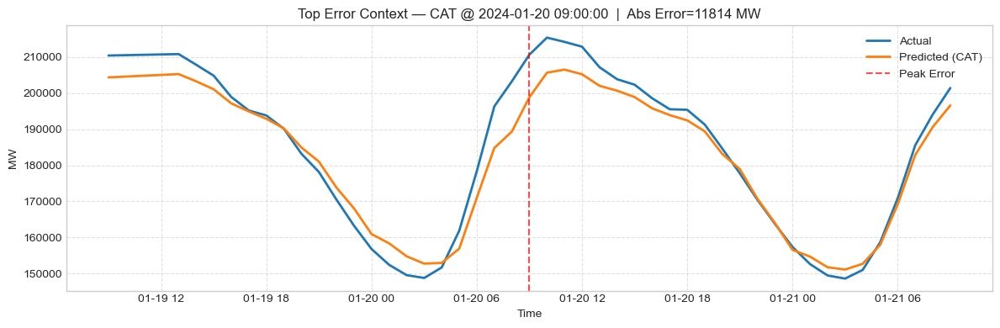

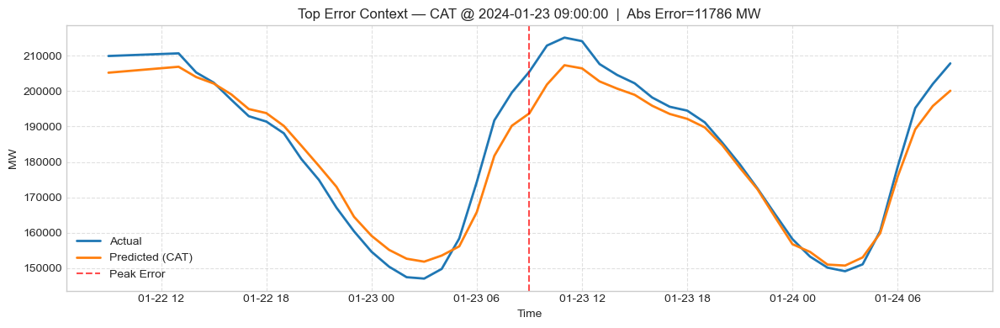

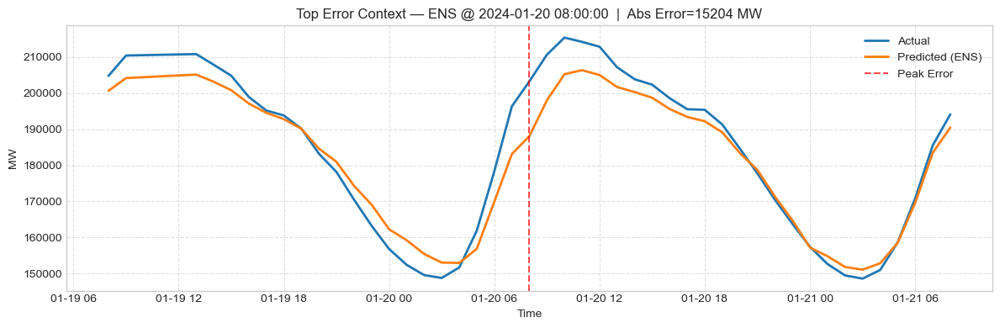

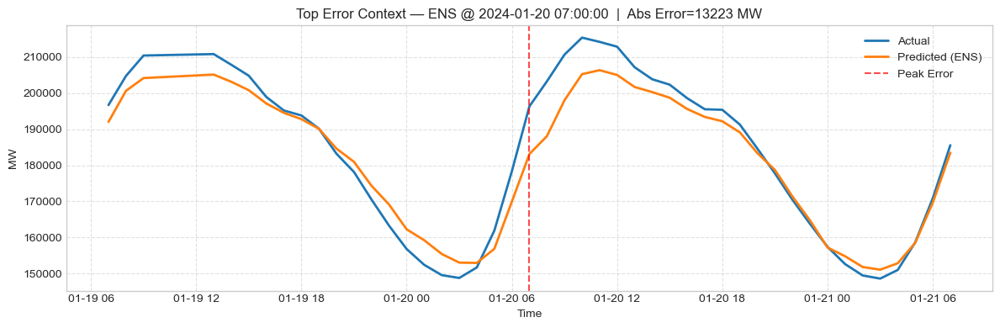

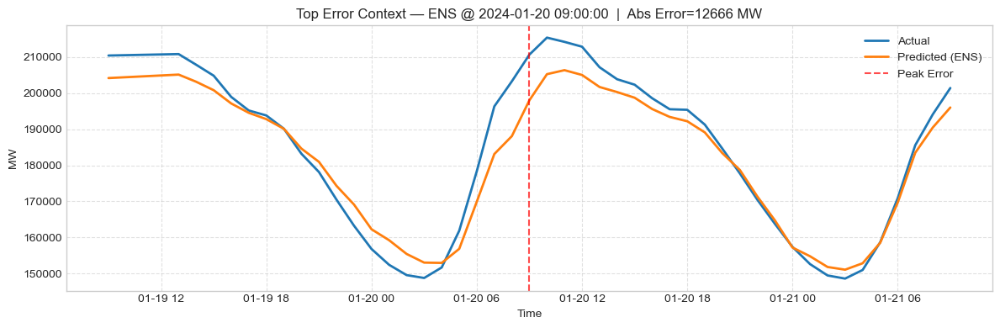

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

y_pred_xgb  = final_model.predict(X_test)
y_pred_lgbm = final_model_l.predict(X_test)
y_pred_cat  = final_model_cat.predict(X_test)

try:
    y_pred_ens
except NameError:
    y_pred_ens = (y_pred_xgb + y_pred_lgbm + y_pred_cat) / 3.0

err = pd.DataFrame(index=X_test.index)
err["y_true"]     = y_test
err["xgb_pred"]   = y_pred_xgb
err["lgbm_pred"]  = y_pred_lgbm
err["cat_pred"]   = y_pred_cat
err["ens_pred"]   = y_pred_ens

for m in ["xgb","lgbm","cat","ens"]:
    err[f"{m}_resid"]    = err["y_true"] - err[f"{m}_pred"]
    err[f"{m}_abs_err"]  = err[f"{m}_resid"].abs()

err["hour"]      = err.index.hour
err["weekday"]   = err.index.dayofweek  # 0=Mon
err["date"]      = err.index.date

def heatmap_abs_error(model_key, title):
    pivot = err.pivot_table(
        index="hour", columns="weekday",
        values=f"{model_key}_abs_err",
        aggfunc="mean"
    ).reindex(index=range(24), columns=range(7))
    fig, ax = plt.subplots(figsize=(7.5, 5.5))
    im = ax.imshow(pivot.values, aspect="auto", origin="lower", cmap="magma")
    ax.set_xticks(range(7)); ax.set_xticklabels(["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
    ax.set_yticks(range(24)); ax.set_yticklabels([f"{h:02d}" for h in range(24)])
    ax.set_xlabel("Day of Week"); ax.set_ylabel("Hour of Day")
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Mean Absolute Error (MW)")
    plt.tight_layout()
    plt.savefig(f"heatmap_abs_error_{model_key}.png", dpi=300)  # SAVE
    plt.show()

heatmap_abs_error("xgb",  "Heatmap of Absolute Error — XGBoost")
heatmap_abs_error("lgbm", "Heatmap of Absolute Error — LightGBM")
heatmap_abs_error("cat",  "Heatmap of Absolute Error — CatBoost")
heatmap_abs_error("ens",  "Heatmap of Absolute Error — Ensemble")

def plot_worst_days_daily(model_key, n_days=3):
    daily_mae = err.groupby("date")[f"{model_key}_abs_err"].mean().sort_values(ascending=False)
    worst_days = list(daily_mae.head(n_days).index)

    for i, d in enumerate(worst_days, start=1):
        day_mask = (err.index.date == d)
        day_idx = err.index[day_mask]
        if len(day_idx) == 0:
            continue

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(err.loc[day_idx].index, err.loc[day_idx, "y_true"], label="Actual", lw=2)
        ax.plot(err.loc[day_idx].index, err.loc[day_idx, f"{model_key}_pred"], label=f"Predicted ({model_key.upper()})", lw=2)
        ax.set_title(f"Worst Day — {model_key.upper()} | {pd.to_datetime(d).date()}  (Daily MAE={daily_mae.loc[d]:.0f} MW)")
        ax.set_xlabel("Time"); ax.set_ylabel("MW"); ax.legend(); ax.grid(True, ls="--", alpha=0.6)
        plt.tight_layout()
        plt.savefig(f"worst_day_{model_key}_{i}.png", dpi=300)  # SAVE
        plt.show()

plot_worst_days_daily("xgb",  n_days=3)
plot_worst_days_daily("lgbm", n_days=3)
plot_worst_days_daily("cat",  n_days=3)
plot_worst_days_daily("ens",  n_days=3)

def plot_top_errors_context(model_key, k=3, context_hours=48):
    top_idx = err[f"{model_key}_abs_err"].sort_values(ascending=False).head(k).index
    half = context_hours // 2

    for i, ts in enumerate(top_idx, start=1):
        start = ts - pd.Timedelta(hours=half)
        end   = ts + pd.Timedelta(hours=half)
        win = err.loc[(err.index >= start) & (err.index <= end)]

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(win.index, win["y_true"], label="Actual", lw=2)
        ax.plot(win.index, win[f"{model_key}_pred"], label=f"Predicted ({model_key.upper()})", lw=2)
        ax.axvline(ts, color="red", ls="--", alpha=0.7, label="Peak Error")
        ae = err.loc[ts, f"{model_key}_abs_err"]
        ax.set_title(f"Top Error Context — {model_key.upper()} @ {ts}  |  Abs Error={ae:.0f} MW")
        ax.set_xlabel("Time"); ax.set_ylabel("MW"); ax.legend(); ax.grid(True, ls="--", alpha=0.6)
        plt.tight_layout()
        plt.savefig(f"top_error_context_{model_key}_{i}.png", dpi=300)  # SAVE
        plt.show()
        
plot_top_errors_context("xgb",  k=3, context_hours=48)
plot_top_errors_context("lgbm", k=3, context_hours=48)
plot_top_errors_context("cat",  k=3, context_hours=48)
plot_top_errors_context("ens",  k=3, context_hours=48)